In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ieee-fraud-detection/sample_submission.csv
/kaggle/input/ieee-fraud-detection/test_identity.csv
/kaggle/input/ieee-fraud-detection/train_identity.csv
/kaggle/input/ieee-fraud-detection/test_transaction.csv
/kaggle/input/ieee-fraud-detection/train_transaction.csv


# IEEE-CIS Fraud Detection: EDA Notebook

# **Key References:**
# - Elif Karakaya’s EDA: https://www.kaggle.com/code/elifkaraktk/ieee-cis-fraud-detection-eda
# - GPreda’s EDA & Modeling: https://www.kaggle.com/code/gpreda/ieee-cis-fraud-detection-eda-model
# - Robik’s First-Look Analysis: https://www.kaggle.com/code/robikscube/ieee-fraud-detection-first-look-and-eda 
# - Maxime’s Missing Value Analysis: https://www.kaggle.com/code/maximmezhov/ieee-cis-fraud-detection-eda/notebook 
# - nroman’s EDA Patterns: https://www.kaggle.com/code/nroman/eda-for-cis-fraud-detection 


In [2]:
# EDA for IEEE-CIS Features: Transaction, Card, Email, Address, Device, and Correlated Variables

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
train_df = '/kaggle/input/ieee-fraud-detection/train_transaction.csv'
test_df = '/kaggle/input/ieee-fraud-detection/test_transaction.csv'
id_df = '/kaggle/input/ieee-fraud-detection/train_identity.csv'

In [4]:
train = pd.read_csv(train_df)


In [6]:
identity = pd.read_csv(id_df)
train = pd.merge(train, identity[['TransactionID', 'DeviceType']], on='TransactionID', how='left')

# EDA Overview

In [7]:
# 1. Dataset size
print("Dataset shape:", train.shape)

# 2. Columns with most null values
null_counts = train.isnull().sum().sort_values(ascending=False)
null_percentage = (null_counts / len(train)) * 100
null_summary = pd.DataFrame({'Null Count': null_counts, 'Null %': null_percentage})
print("\nColumns with Null Values % 80:", null_summary[null_summary['Null %'] > 80].count() )
print(null_summary[null_summary['Null %'] > 80])

Dataset shape: (590540, 396)

Columns with Null Values % 80: Null Count    55
Null %        55
dtype: int64
       Null Count     Null %
dist2      552913  93.628374
D7         551623  93.409930
D13        528588  89.509263
D14        528353  89.469469
D12        525823  89.041047
D6         517353  87.606767
D8         515614  87.312290
D9         515614  87.312290
V154       508595  86.123717
V138       508595  86.123717
V163       508595  86.123717
V162       508595  86.123717
V161       508595  86.123717
V158       508595  86.123717
V157       508595  86.123717
V155       508595  86.123717
V139       508595  86.123717
V153       508595  86.123717
V148       508595  86.123717
V140       508595  86.123717
V141       508595  86.123717
V142       508595  86.123717
V146       508595  86.123717
V147       508595  86.123717
V156       508595  86.123717
V149       508595  86.123717
V152       508589  86.122701
V165       508589  86.122701
V166       508589  86.122701
V160       508589  86.

In [81]:
# 4. Group columns by feature prefix/type
v_cols = [col for col in train.columns if col.startswith('V')]
m_cols = [col for col in train.columns if col.startswith('M')]
card_cols = [col for col in train.columns if col.startswith('card')]
addr_cols = [col for col in train.columns if col.startswith('addr')]
d_cols = [col for col in train.columns if col.startswith('D')]
id_cols = [col for col in train.columns if col.startswith('id_')]
transaction_cols = ['TransactionAmt', 'TransactionDT']
email_cols = [col for col in train.columns if 'email' in col.lower()]
time_cols = ['TransactionDT'] + [col for col in train.columns if col.startswith('D') or 'time' in col.lower()]

In [82]:

print("\nFeature Groups:")
print("V features:", len(v_cols))
print("M features:", len(m_cols))
print("Card features:", len(card_cols))
print("Address features:", len(addr_cols))
print("D features (Time delay):", len(d_cols))
print("ID features:", len(id_cols))
print("Email-related features:", len(email_cols))
print("Transaction-related features:", transaction_cols)
print("Time-related features:", time_cols)


Feature Groups:
V features: 339
M features: 27
Card features: 10
Address features: 2
D features (Time delay): 16
ID features: 0
Email-related features: 8
Transaction-related features: ['TransactionAmt', 'TransactionDT']
Time-related features: ['TransactionDT', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'DeviceType']


In [18]:
import pandas as pd


# Merge on TransactionID
df_train = train
# Calculate missing value % per column
missing_stats = df_train.isnull().mean().sort_values(ascending=False) * 100
missing_stats = missing_stats.reset_index()
missing_stats.columns = ['Column', 'Missing (%)']

# Classify columns into feature groups
def classify_feature(col):
    if col.startswith('V'):
        return 'V Features'
    elif col.startswith('id_'):
        return 'Identity Features'
    elif col.startswith('card'):
        return 'Card Features'
    elif col.startswith('M'):
        return 'M Features'
    elif col.startswith('C'):
        return 'C Features'
    elif col.startswith('D'):
        return 'D Features'
    elif col in ['addr1', 'addr2']:
        return 'Address Features'
    elif col in ['dist1', 'dist2']:
        return 'Distance Features'
    elif col in ['P_emaildomain', 'R_emaildomain']:
        return 'Email Domains'
    elif col in ['DeviceType', 'DeviceInfo']:
        return 'Device Features'
    elif col in ['TransactionID', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'isFraud']:
        return 'Transaction Features'
    else:
        return 'Other'

missing_stats['Feature Group'] = missing_stats['Column'].apply(classify_feature)

# Summarize by feature group
group_summary = missing_stats.groupby('Feature Group').agg({
    'Column': 'count',
    'Missing (%)': 'mean'
}).reset_index().round(2)
group_summary.columns = ['Feature Group', 'No. of Columns', 'Avg. Missing (%)']
group_summary = group_summary.sort_values (by="Avg. Missing (%)", ascending=False)

# Display nicely
from IPython.display import display
display(group_summary)

,Feature Group,No. of Columns,Avg. Missing (%)
4,Distance Features,2,76.64
3,D Features,17,60.27
6,M Features,9,49.92
5,Email Domains,2,46.37
8,V Features,339,43.04
0,Address Features,2,11.13
2,Card Features,6,0.51
1,C Features,14,0.00
7,Transaction Features,5,0.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 396 entries, TransactionID to DeviceType_y
dtypes: float64(376), int64(4), object(16)
memory usage: 1.7+ GB
None
Fraud proportion:
 isFraud
0    0.96501
1    0.03499
Name: proportion, dtype: float64
Features with >80% missing values:
 dist2    0.936284
D7       0.934099
D13      0.895093
D14      0.894695
D12      0.890410
D6       0.876068
D8       0.873123
D9       0.873123
V154     0.861237
V138     0.861237
V163     0.861237
V162     0.861237
V161     0.861237
V158     0.861237
V157     0.861237
V155     0.861237
V139     0.861237
V153     0.861237
V148     0.861237
V140     0.861237
V141     0.861237
V142     0.861237
V146     0.861237
V147     0.861237
V156     0.861237
V149     0.861237
V152     0.861227
V165     0.861227
V166     0.861227
V160     0.861227
V145     0.861227
V143     0.861227
V159     0.861227
V150     0.861227
V151     0.861227
V164     0.861227
V144     0.861227
V329     0.8

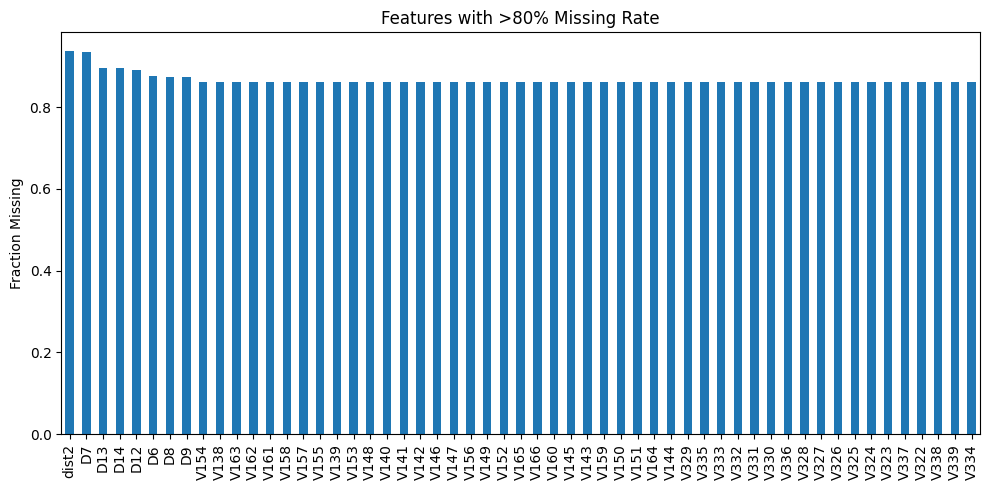

count: 55


In [25]:
# ## Initial Inspection & Missing Values
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'train' is your merged dataset (train_transaction + train_identity)
# If not already merged:
# train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')

# Inspect dataset
print(train.info())
print("Fraud proportion:\n", train['isFraud'].value_counts(normalize=True))

# Calculate missing percentages
missing_pct = train.isnull().mean().sort_values(ascending=False)

# Filter features with >80% missing values
high_missing = missing_pct[missing_pct > 0.80]
print("Features with >80% missing values:\n", high_missing)


# Optional: plot top ones
plt.figure(figsize=(10, 5))
high_missing.plot.bar()
plt.title('Features with >80% Missing Rate')
plt.ylabel('Fraction Missing')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()
print("count:", len(high_missing))

In [97]:
missing_stats_df = pd.DataFrame({
    'Feature': missing_stats.index,
    'MissingRate': (missing_stats.values * 100).round(2)
})
print(missing_stats_df)

   Feature  MissingRate
0    dist2        93.63
1       D7        93.41
2      D13        89.51
3      D14        89.47
4      D12        89.04
5       D6        87.61
6       D8        87.31
7       D9        87.31
8     V139        86.12
9     V149        86.12
10    V148        86.12
11    V147        86.12
12    V146        86.12
13    V154        86.12
14    V155        86.12
15    V156        86.12
16    V157        86.12
17    V158        86.12
18    V161        86.12
19    V162        86.12


In [26]:
import pandas as pd

# Assume `train` is your merged dataset (train_transaction + train_identity)
# We'll simulate a basic structure with similar missing values here for demonstration
# In practice, replace this with: missing_pct = train.isnull().mean() * 100

# Using the previously calculated missing_pct for real datasets
missing_pct = train.isnull().mean() * 100

# Define bins and labels
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
labels = ['<10%', '10-20%', '20-30%', '30-40%', '40-50%', 
          '50-60%', '60-70%', '70-80%', '80-90%', '90-100%']

# Bin the missing percentages
missing_bin = pd.cut(missing_pct, bins=bins, labels=labels, include_lowest=True)

# Count of columns in each bin
bin_summary = missing_bin.value_counts(sort=False).reset_index()
bin_summary.columns = ['Missing % Range', 'No. of Columns']

# Display
from IPython.display import display
display(bin_summary)


,Missing % Range,No. of Columns
0,<10%,112
1,10-20%,70
2,20-30%,20
3,30-40%,0
4,40-50%,18
5,50-60%,6
6,60-70%,0
7,70-80%,115
8,80-90%,53
9,90-100%,2


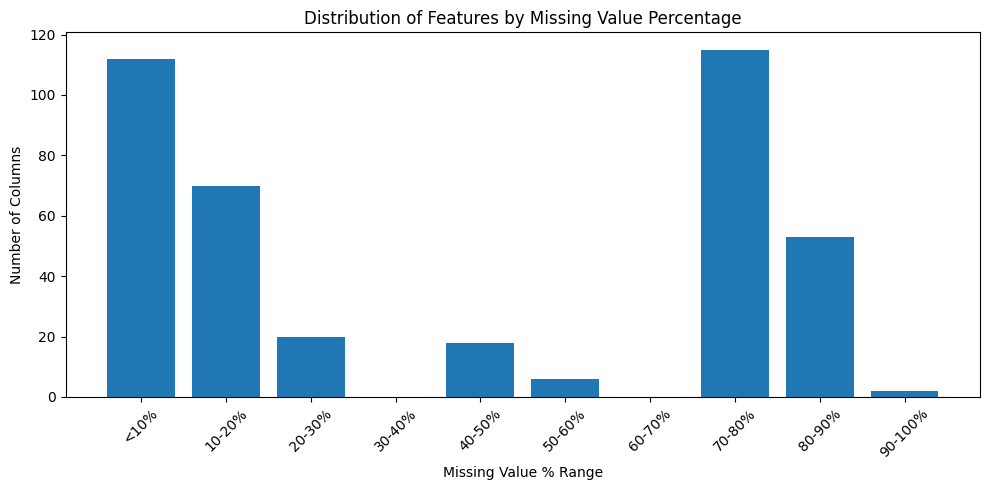

In [27]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.bar(bin_summary['Missing % Range'], bin_summary['No. of Columns'])
plt.title('Distribution of Features by Missing Value Percentage')
plt.xlabel('Missing Value % Range')
plt.ylabel('Number of Columns')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 1. Transaction Amount Distribution

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


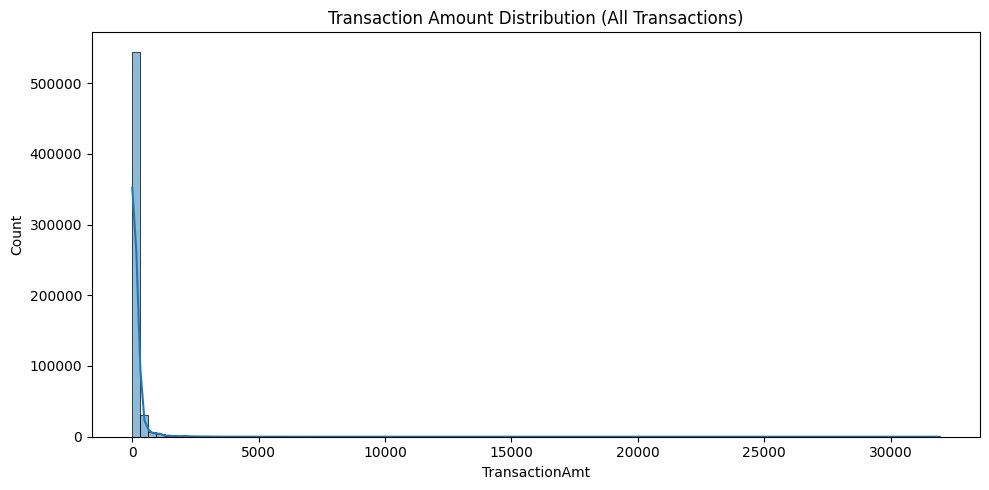

In [31]:
# 1. Basic Histogram
plt.figure(figsize=(10, 5))
sns.histplot(train['TransactionAmt'], bins=100, kde=True)
plt.title("Transaction Amount Distribution (All Transactions)")
plt.xlabel("TransactionAmt")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


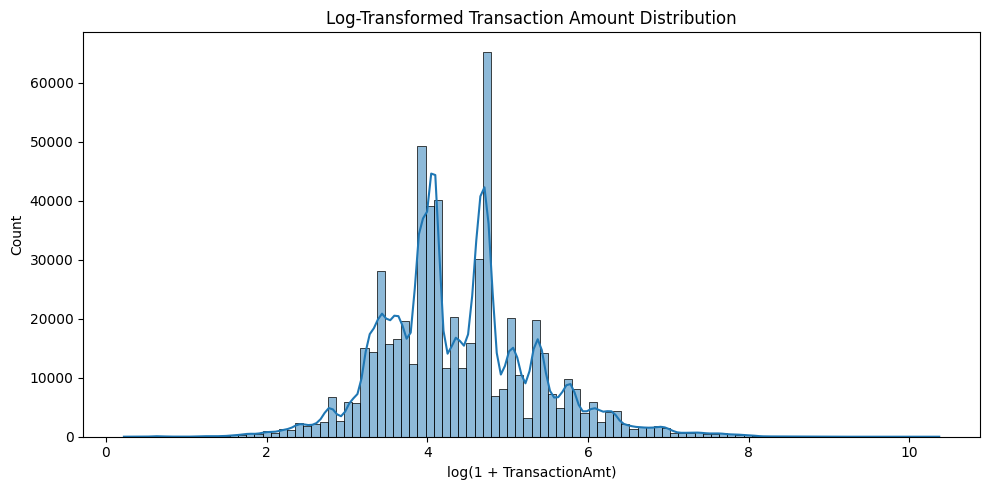

In [33]:
# 2. Log-transformed Distribution
train['TransactionAmt_log'] = np.log1p(train['TransactionAmt'])
plt.figure(figsize=(10, 5))
sns.histplot(train['TransactionAmt_log'], bins=100, kde=True)
plt.title("Log-Transformed Transaction Amount Distribution")
plt.xlabel("log(1 + TransactionAmt)")
plt.tight_layout()
plt.show()

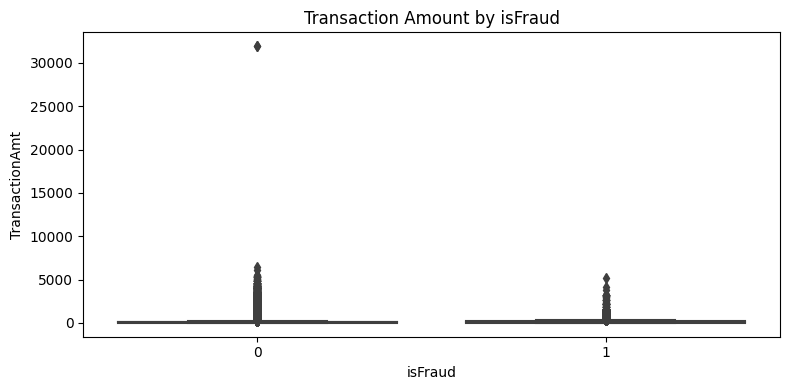

In [34]:
# 3. Boxplot by Fraud
plt.figure(figsize=(8, 4))
sns.boxplot(data=train, x='isFraud', y='TransactionAmt')
plt.title("Transaction Amount by isFraud")
plt.xlabel("isFraud")
plt.ylabel("TransactionAmt")
plt.tight_layout()
plt.show()

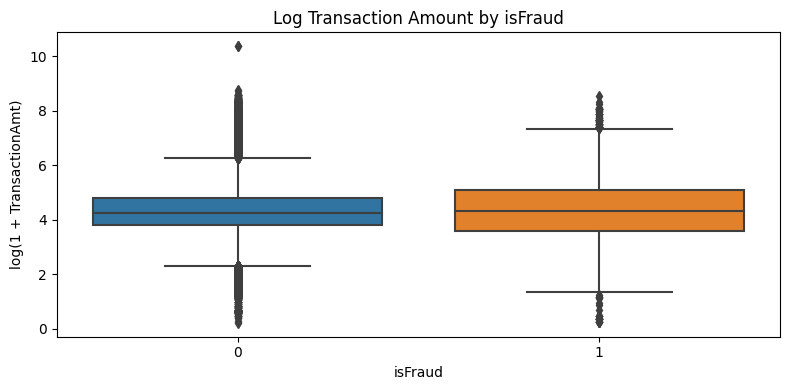

In [35]:
# 4. Log-Scale Boxplot by Fraud
plt.figure(figsize=(8, 4))
sns.boxplot(data=train, x='isFraud', y='TransactionAmt_log')
plt.title("Log Transaction Amount by isFraud")
plt.xlabel("isFraud")
plt.ylabel("log(1 + TransactionAmt)")
plt.tight_layout()
plt.show()


/tmp/ipykernel_35/757826003.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fraud_rate = train.groupby('AmtBin')['isFraud'].mean()


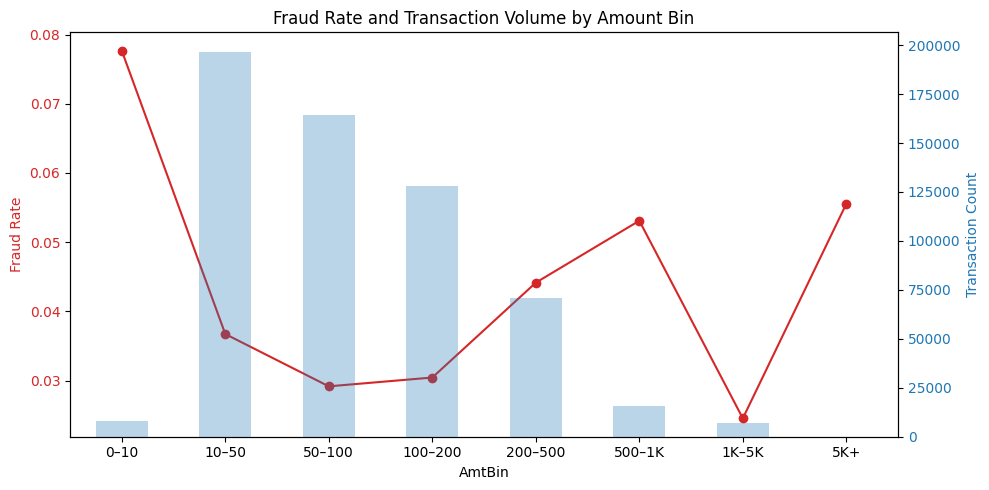

In [39]:
# 6. Fraud Rate by Transaction Amount Bins
bins = [0, 10, 50, 100, 200, 500, 1000, 5000, train['TransactionAmt'].max()]
labels = ['0–10', '10–50', '50–100', '100–200', '200–500', '500–1K', '1K–5K', '5K+']
train['AmtBin'] = pd.cut(train['TransactionAmt'], bins=bins, labels=labels, include_lowest=True)
fraud_rate = train.groupby('AmtBin')['isFraud'].mean()
transaction_count = train['AmtBin'].value_counts().sort_index()


# Plot Fraud Rate by Bin
fig, ax1 = plt.subplots(figsize=(10, 5))
color = 'tab:red'
ax1.set_xlabel('TransactionAmt Bin')
ax1.set_ylabel('Fraud Rate', color=color)
fraud_rate.plot(kind='line', marker='o', ax=ax1, color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Plot Count on second y-axis
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Transaction Count', color=color)
transaction_count.plot(kind='bar', alpha=0.3, ax=ax2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
plt.title("Fraud Rate and Transaction Volume by Amount Bin")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# 2. ProductCD Distribution by Fraud**

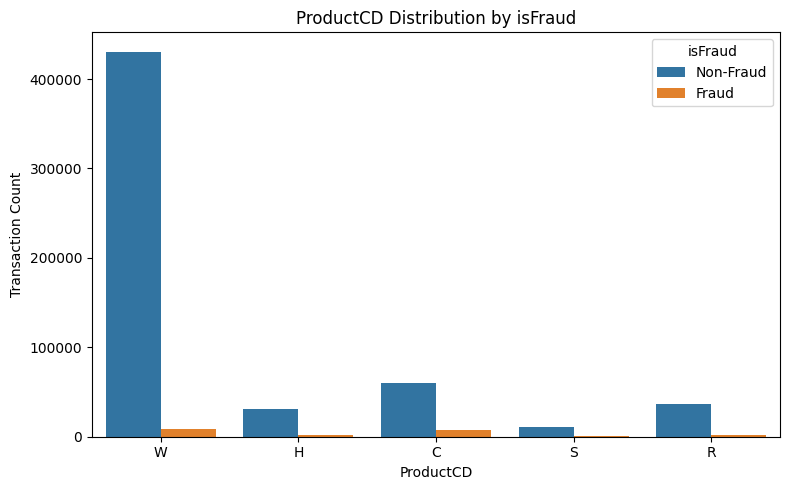

In [40]:
# Countplot of ProductCD by isFraud
plt.figure(figsize=(8, 5))
sns.countplot(data=train, x='ProductCD', hue='isFraud')
plt.title("ProductCD Distribution by isFraud")
plt.xlabel("ProductCD")
plt.ylabel("Transaction Count")
plt.legend(title="isFraud", labels=["Non-Fraud", "Fraud"])
plt.tight_layout()
plt.show()

In [15]:
# Calculate Fraud Rate per ProductCD
product_fraud_stats = train.groupby('ProductCD')['isFraud'].agg(['mean', 'count']).rename(columns={'mean': 'FraudRate', 'count': 'TotalTransactions'})
product_fraud_stats = product_fraud_stats.sort_values(by='FraudRate', ascending=False)
print("\nFraud Rate per ProductCD:")
display(product_fraud_stats)


Fraud Rate per ProductCD:


,FraudRate,TotalTransactions
ProductCD,,
C,0.116873,68519
S,0.058996,11628
H,0.047662,33024
R,0.037826,37699
W,0.020399,439670


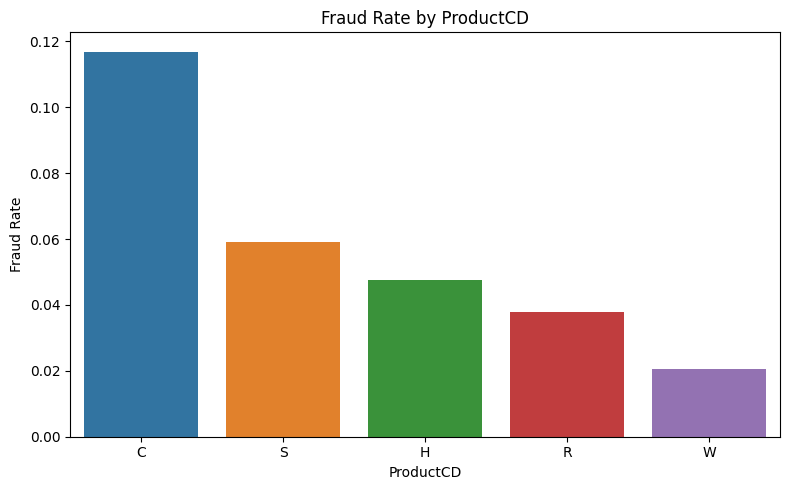

In [42]:
# Plot Fraud Rate per ProductCD
plt.figure(figsize=(8, 5))
sns.barplot(x=product_fraud_stats.index, y=product_fraud_stats['FraudRate'])
plt.title("Fraud Rate by ProductCD")
plt.xlabel("ProductCD")
plt.ylabel("Fraud Rate")
plt.tight_layout()
plt.show()


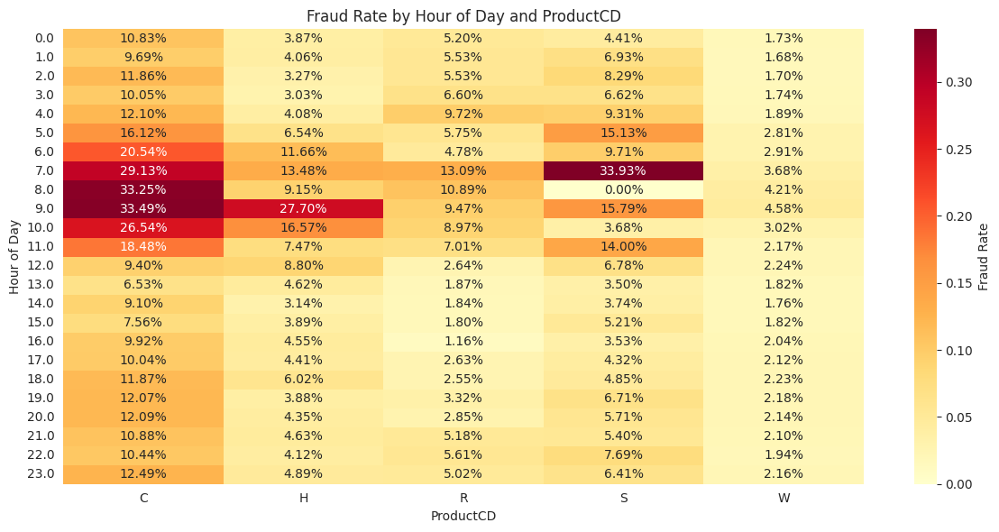

In [96]:
# 10.2 Continuous–Categorical: Pivot‐Table Heatmap of Fraud Rate
# --------------------------------------------------------------

# Example: how fraud rate varies across Transaction Hour vs. Product Code
pivot_hour_prod = df.pivot_table(
    index='Trans_hour',
    columns='ProductCD',
    values='isFraud',
    aggfunc='mean'
)

plt.figure(figsize=(12, 6))
sns.heatmap(
    pivot_hour_prod,
    annot=True,
    fmt=".2%",              # show as percentage
    cmap='YlOrRd',
    cbar_kws={'label': 'Fraud Rate'}
)
plt.ylabel('Hour of Day')
plt.xlabel('ProductCD')
plt.title('Fraud Rate by Hour of Day and ProductCD')
plt.tight_layout()
plt.show()


# 3. Card-related Features

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


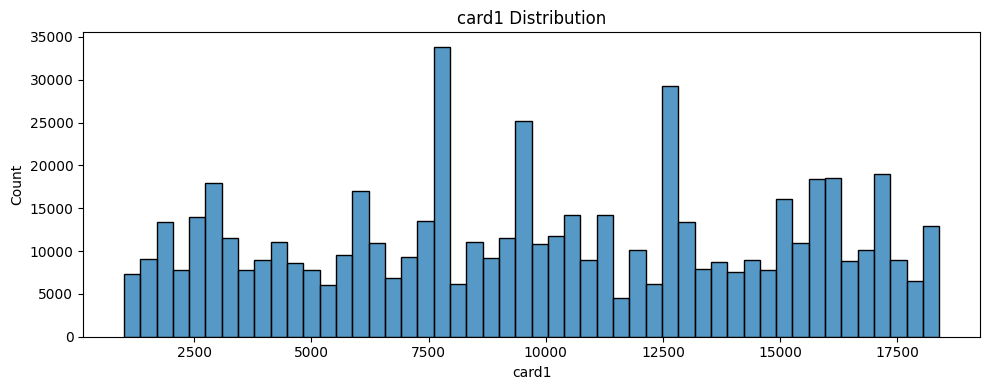

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


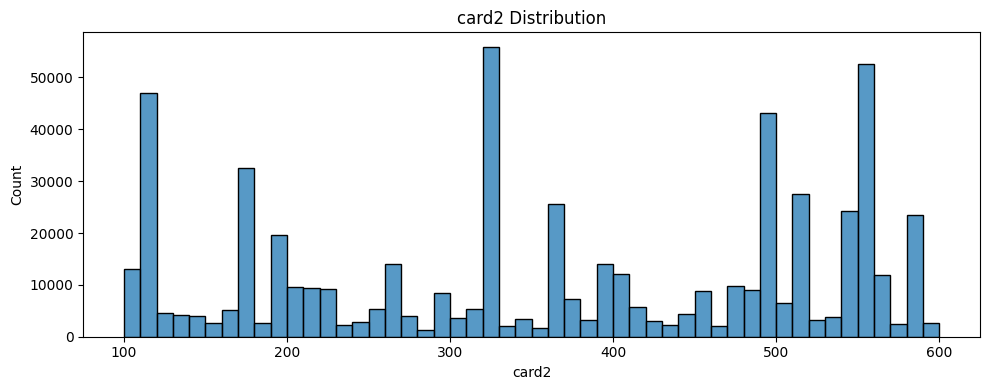

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


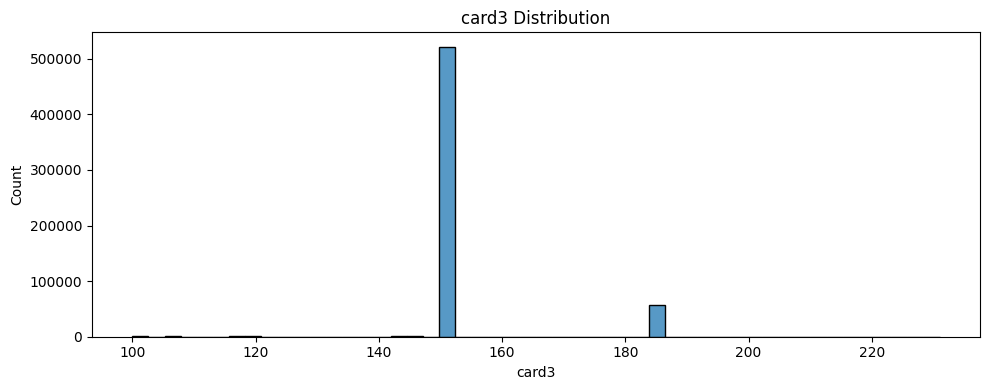

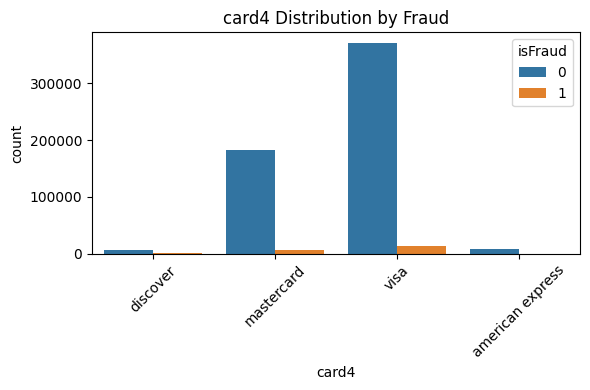

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


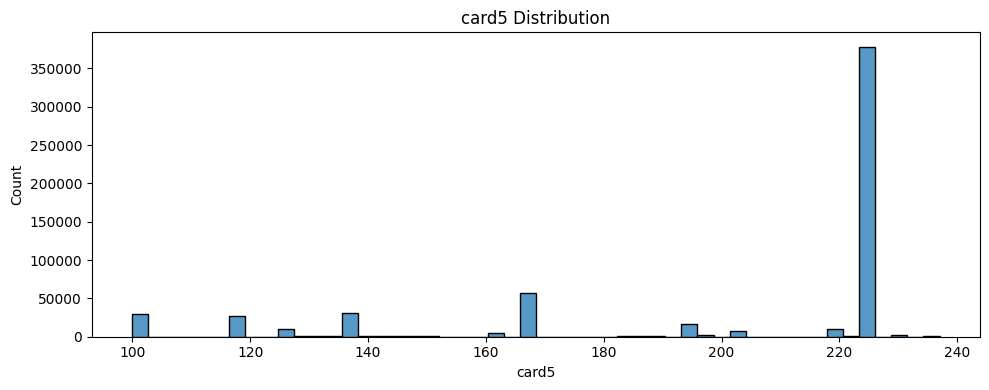

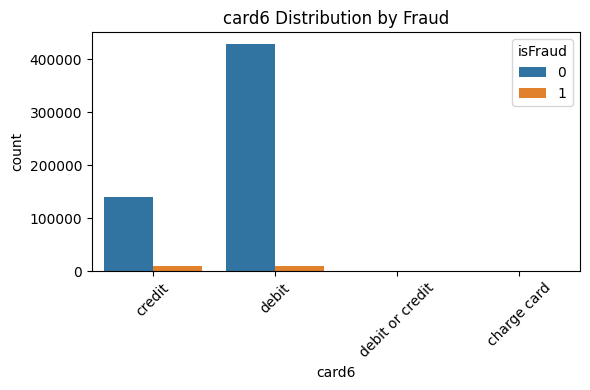

In [12]:
card_features = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']
for col in card_features:
    if col in train.columns:
        if train[col].nunique() < 20:
            plt.figure(figsize=(6, 4))
            sns.countplot(data=train, x=col, hue='isFraud')
            plt.title(f"{col} Distribution by Fraud")
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
        else:
            plt.figure(figsize=(10, 4))
            sns.histplot(train[col], bins=50, kde=False)
            plt.title(f"{col} Distribution")
            plt.tight_layout()
            plt.show()

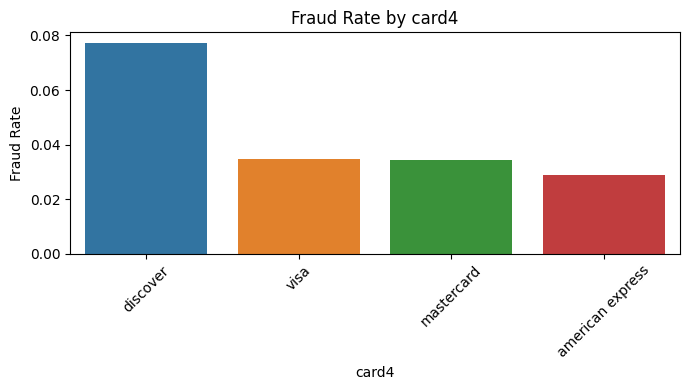

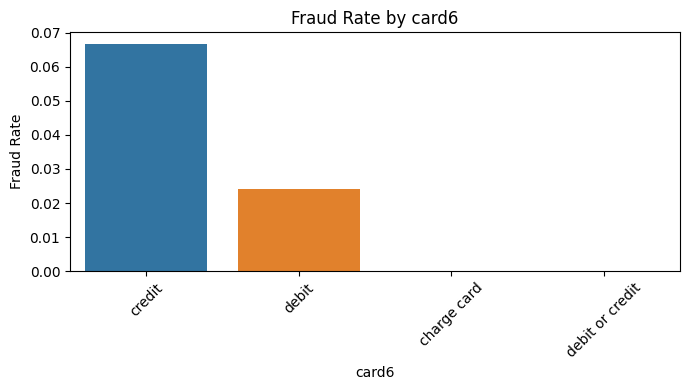

In [43]:
for col in ['card4', 'card6']:
    if col in train.columns:
        fraud_rate = train.groupby(col)['isFraud'].mean().sort_values(ascending=False)
        plt.figure(figsize=(7, 4))
        sns.barplot(x=fraud_rate.index, y=fraud_rate.values)
        plt.title(f"Fraud Rate by {col}")
        plt.xlabel(col)
        plt.ylabel("Fraud Rate")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# 4. Email domain (P_emaildomain)

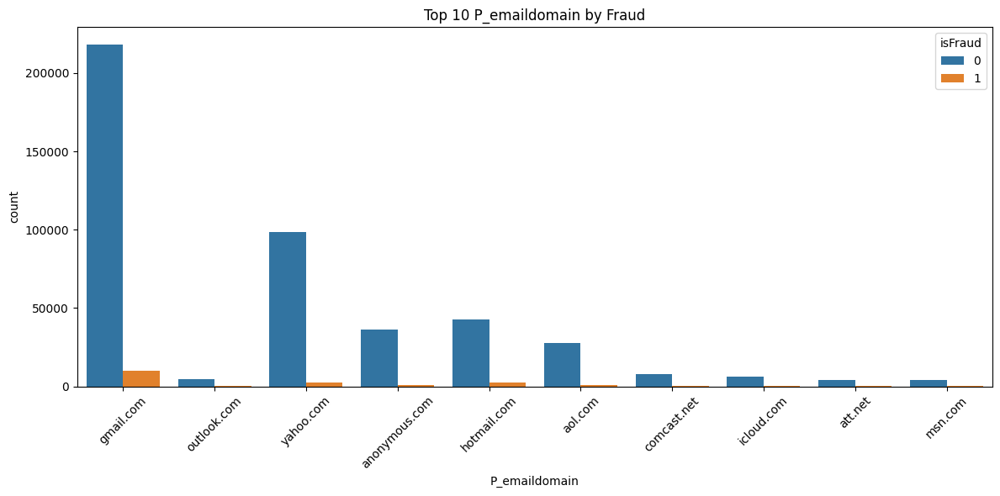

In [13]:
if 'P_emaildomain' in train.columns:
    plt.figure(figsize=(12, 6))
    top_domains = train['P_emaildomain'].value_counts().nlargest(10).index
    temp = train[train['P_emaildomain'].isin(top_domains)]
    sns.countplot(data=temp, x='P_emaildomain', hue='isFraud')
    plt.title("Top 10 P_emaildomain by Fraud")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

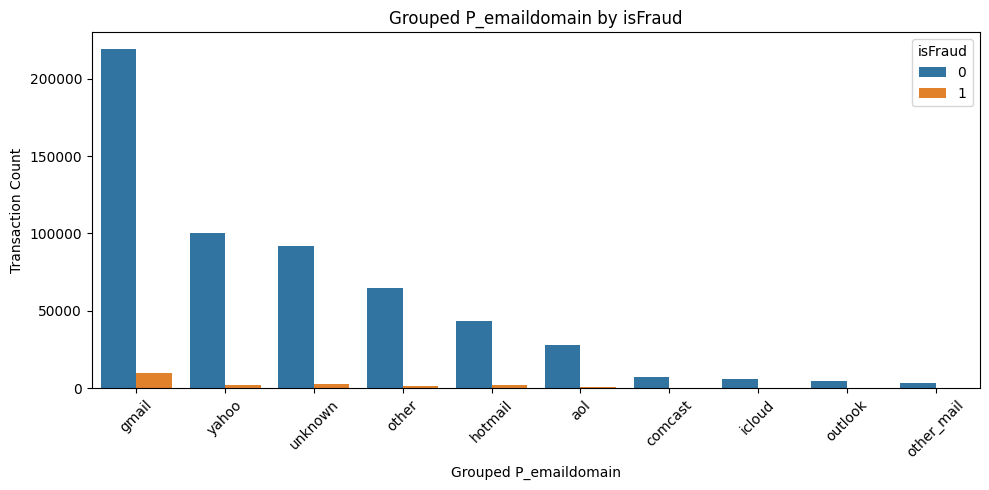

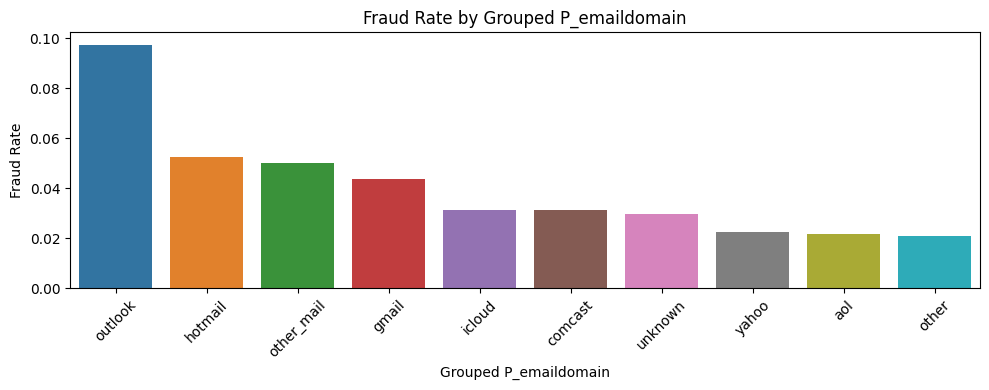

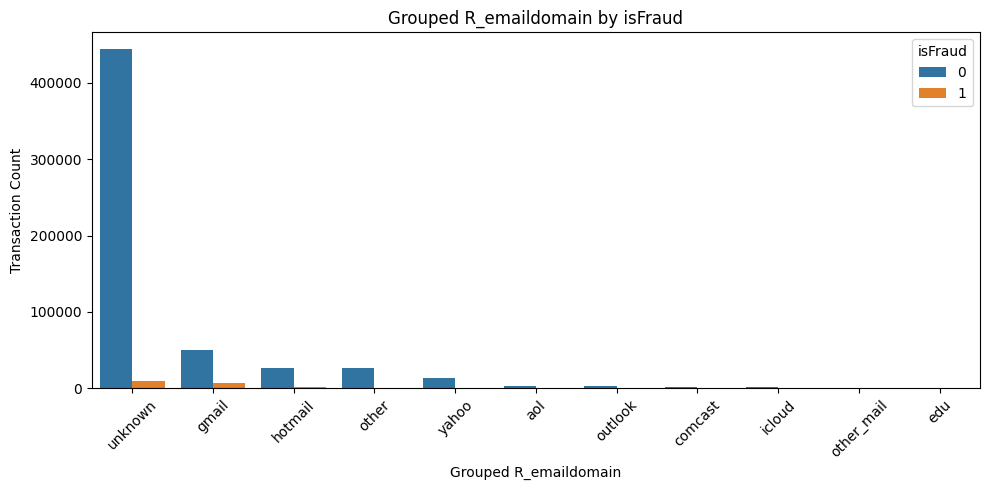

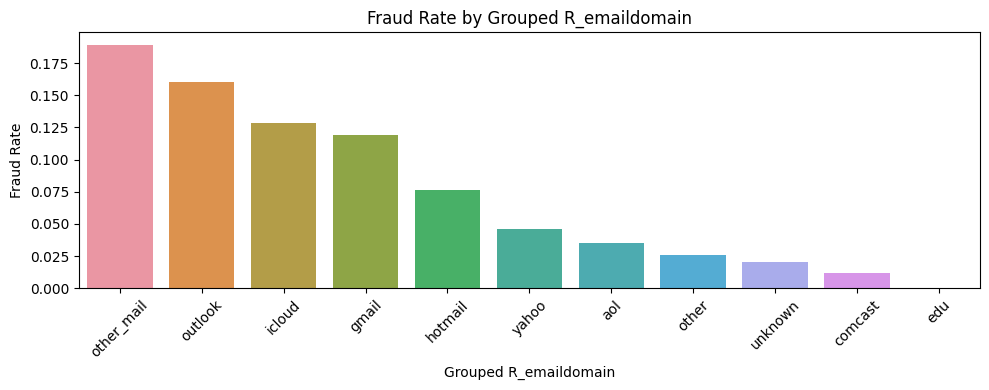

In [44]:
# Group email domains into common providers
def group_email_domain(domain):
    if pd.isnull(domain): return 'unknown'
    domain = domain.lower()
    if 'gmail' in domain: return 'gmail'
    elif 'yahoo' in domain: return 'yahoo'
    elif 'hotmail' in domain: return 'hotmail'
    elif 'outlook' in domain: return 'outlook'
    elif 'aol' in domain: return 'aol'
    elif 'icloud' in domain: return 'icloud'
    elif 'mail' in domain: return 'other_mail'
    elif 'comcast' in domain: return 'comcast'
    elif any(x in domain for x in ['edu', 'school']): return 'edu'
    else: return 'other'

for col in ['P_emaildomain', 'R_emaildomain']:
    if col in train.columns:
        train[f'{col}_group'] = train[col].apply(group_email_domain)

        # Countplot
        plt.figure(figsize=(10, 5))
        sns.countplot(data=train, x=f'{col}_group', hue='isFraud', order=train[f'{col}_group'].value_counts().index)
        plt.title(f"Grouped {col} by isFraud")
        plt.xlabel(f"Grouped {col}")
        plt.ylabel("Transaction Count")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        # Fraud rate
        fraud_rate = train.groupby(f'{col}_group')['isFraud'].mean().sort_values(ascending=False)
        plt.figure(figsize=(10, 4))
        sns.barplot(x=fraud_rate.index, y=fraud_rate.values)
        plt.title(f"Fraud Rate by Grouped {col}")
        plt.xlabel(f"Grouped {col}")
        plt.ylabel("Fraud Rate")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Email Domain + DeviceType interaction plot
if 'DeviceType' in train.columns:
    train['DeviceType'] = train['DeviceType'].fillna('unknown').astype(str)
    train['EmailDeviceCombo'] = train['P_emaildomain'].fillna('unknown') + '_' + train['DeviceType']
    top_combos = train['EmailDeviceCombo'].value_counts().head(10).index
    combo_subset = train[train['EmailDeviceCombo'].isin(top_combos)]

    plt.figure(figsize=(12, 5))
    sns.countplot(data=combo_subset, x='EmailDeviceCombo', hue='isFraud', order=top_combos)
    plt.title("Top 10 Email Domain + DeviceType Combinations by isFraud")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# 5. Address Features

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


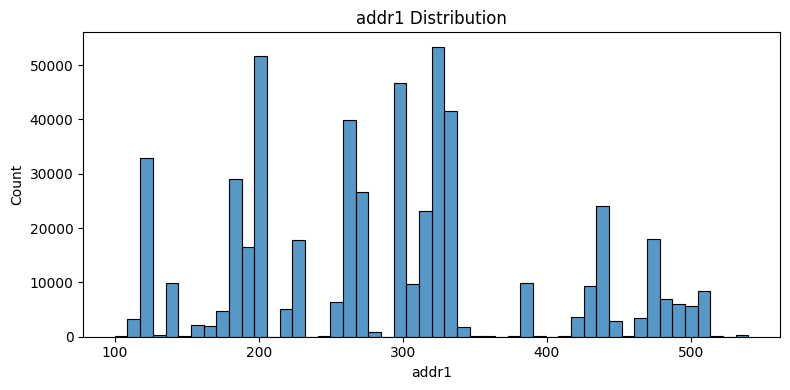

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


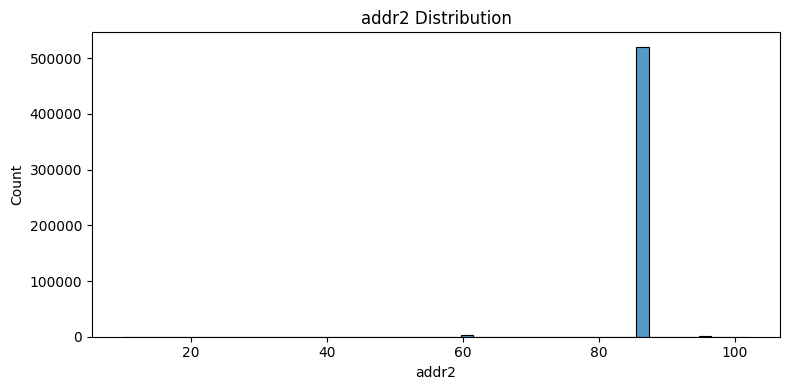

In [14]:
for col in ['addr1', 'addr2']:
    if col in train.columns:
        plt.figure(figsize=(8, 4))
        sns.histplot(train[col], bins=50, kde=False)
        plt.title(f"{col} Distribution")
        plt.tight_layout()
        plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


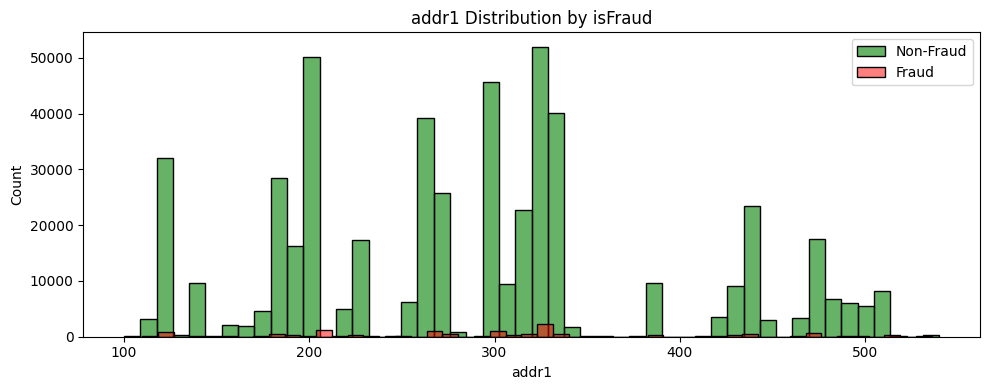

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


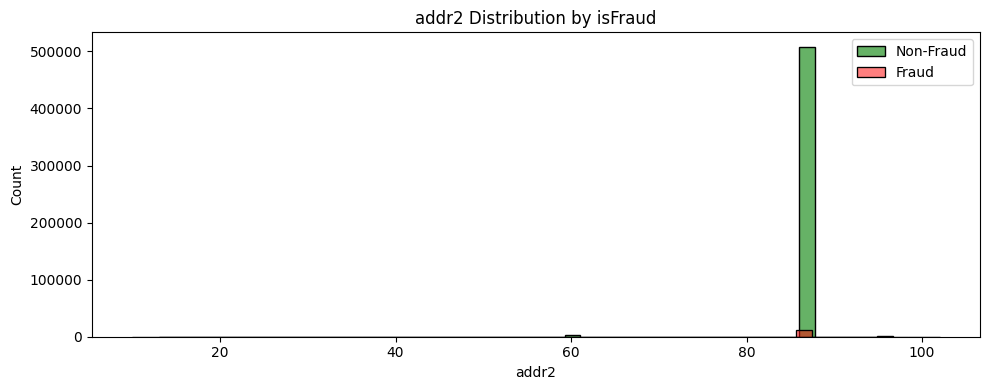

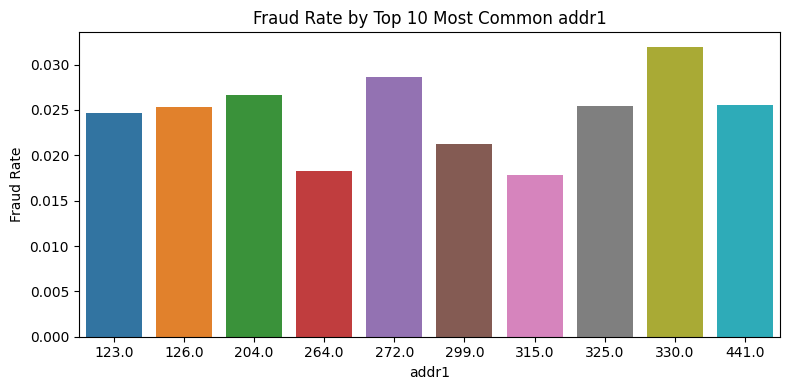

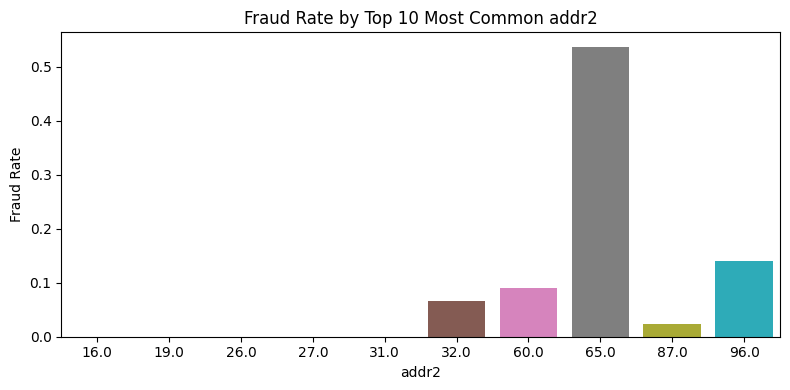

In [46]:
address_features = ['addr1', 'addr2']

# Histogram plots for addr1 and addr2
for col in address_features:
    if col in train.columns:
        plt.figure(figsize=(10, 4))
        sns.histplot(train[train['isFraud'] == 0][col], bins=50, label='Non-Fraud', color='green', alpha=0.6)
        sns.histplot(train[train['isFraud'] == 1][col], bins=50, label='Fraud', color='red', alpha=0.5)
        plt.title(f"{col} Distribution by isFraud")
        plt.legend()
        plt.tight_layout()
        plt.show()

# Calculate fraud rate per addr1 and addr2 (Top 10 only)
for col in address_features:
    if col in train.columns:
        top_values = train[col].value_counts().head(10).index
        subset = train[train[col].isin(top_values)]

        fraud_rate = subset.groupby(col)['isFraud'].mean()
        plt.figure(figsize=(8, 4))
        sns.barplot(x=fraud_rate.index.astype(str), y=fraud_rate.values)
        plt.title(f"Fraud Rate by Top 10 Most Common {col}")
        plt.xlabel(col)
        plt.ylabel("Fraud Rate")
        plt.tight_layout()
        plt.show()


# 6. DeviceType Distribution

In [23]:
if 'DeviceType' in train.columns:
    print("Unique values in DeviceType:", train['DeviceType'].unique())
    
    # Convert to string if not already
    train['DeviceType'] = train['DeviceType'].astype(str)

    # Replace missing values or invalid entries
    train['DeviceType'].fillna('unknown', inplace=True)
    train['DeviceType'] = train['DeviceType'].replace(['nan', 'None', 'NaN'], 'unknown')

    plt.figure(figsize=(6, 4))
    sns.countplot(data=train, x='DeviceType', hue='isFraud', order=train['DeviceType'].value_counts().index)
    plt.title("DeviceType Distribution by Fraud")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("'DeviceType' not found in dataset.")

'DeviceType' not found in dataset.


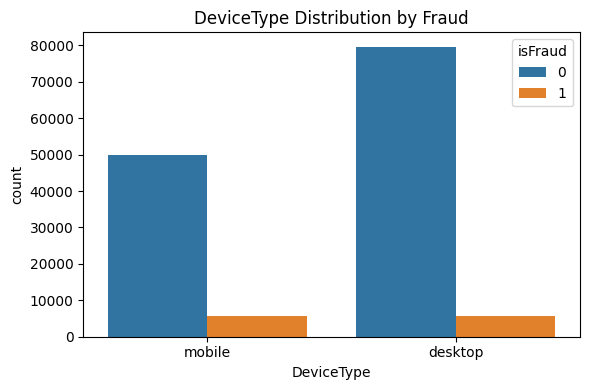

In [26]:
if 'DeviceType' in train.columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=train, x='DeviceType', hue='isFraud')
    plt.title("DeviceType Distribution by Fraud")
    plt.tight_layout()
    plt.show()

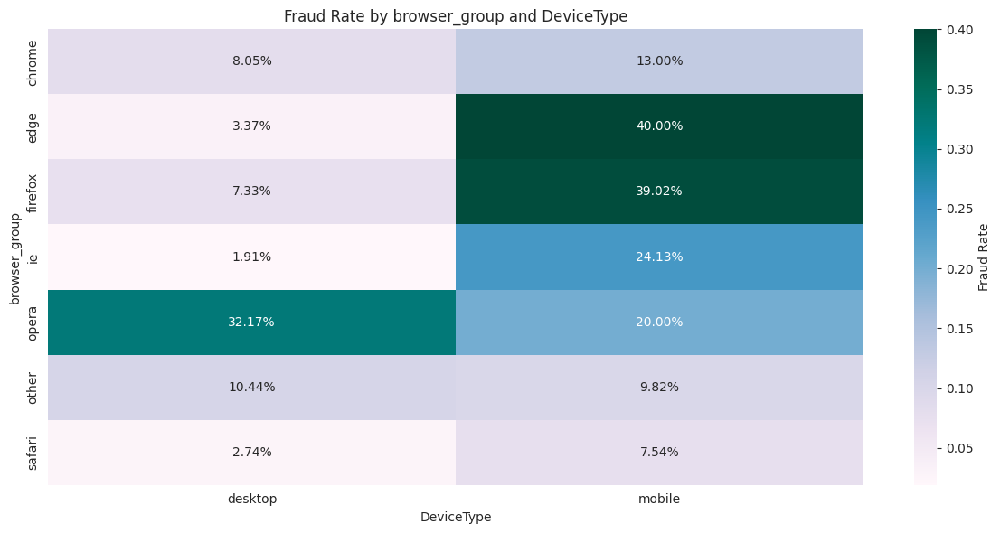

In [95]:


# 10.3 Categorical–Categorical: Fraud Rate across Browser × Device
# -----------------------------------------------------------------

# If DeviceType is not present, swap in another high-cardinality cat.
if 'DeviceType' in df.columns:
    idx, cols = 'browser_group', 'DeviceType'
else:
    idx, cols = 'browser_group', 'ProductCD'

pivot_cat = df.pivot_table(
    index=idx,
    columns=cols,
    values='isFraud',
    aggfunc='mean'
)

plt.figure(figsize=(12, 6))
sns.heatmap(
    pivot_cat,
    annot=True,
    fmt=".2%",
    cmap='PuBuGn',
    cbar_kws={'label': 'Fraud Rate'}
)
plt.ylabel(idx)
plt.xlabel(cols)
plt.title(f'Fraud Rate by {idx} and {cols}')
plt.tight_layout()
plt.show()

# 7. EDA for Temporal Features and Fraud Patterns

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

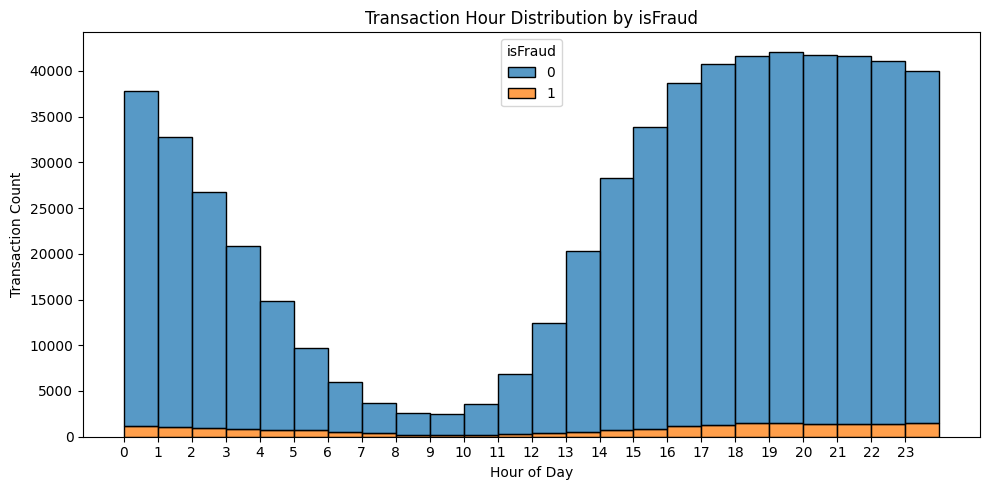

In [49]:
# Convert TransactionDT into hours (assuming 3600s per hour)
if 'TransactionDT' in train.columns:
    train['TransactionHour'] = (train['TransactionDT'] / 3600) % 24

    # Plot histogram by hour
    plt.figure(figsize=(10, 5))
    sns.histplot(data=train, x='TransactionHour', hue='isFraud', bins=24, kde=False, multiple='stack')
    plt.title("Transaction Hour Distribution by isFraud")
    plt.xlabel("Hour of Day")
    plt.ylabel("Transaction Count")
    plt.xticks(range(0, 24))
    plt.tight_layout()
    plt.show()


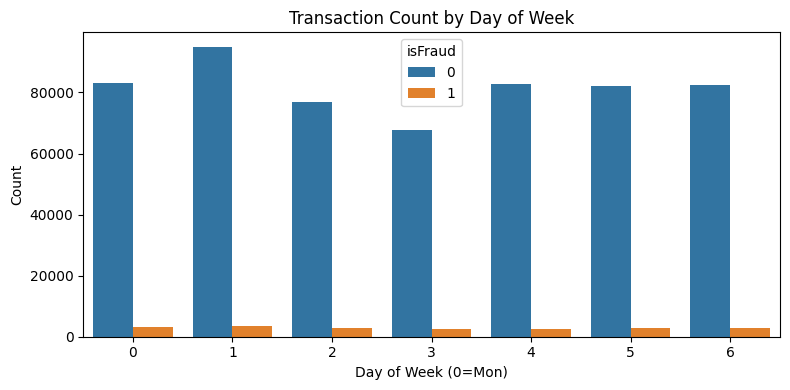

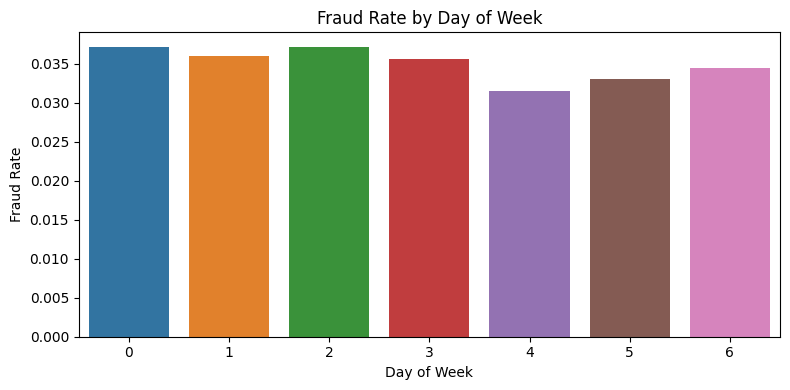

In [50]:
# Add day-based features if available
if 'TransactionDT' in train.columns:
    train['TransactionDay'] = (train['TransactionDT'] / (3600 * 24)).astype(int) % 7

    plt.figure(figsize=(8, 4))
    sns.countplot(data=train, x='TransactionDay', hue='isFraud')
    plt.title("Transaction Count by Day of Week")
    plt.xlabel("Day of Week (0=Mon)")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

    fraud_rate_day = train.groupby('TransactionDay')['isFraud'].mean()
    plt.figure(figsize=(8, 4))
    sns.barplot(x=fraud_rate_day.index, y=fraud_rate_day.values)
    plt.title("Fraud Rate by Day of Week")
    plt.xlabel("Day of Week")
    plt.ylabel("Fraud Rate")
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_35/3830906910.py:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Trans_hour', y='isFraud', data=train, ci=None)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


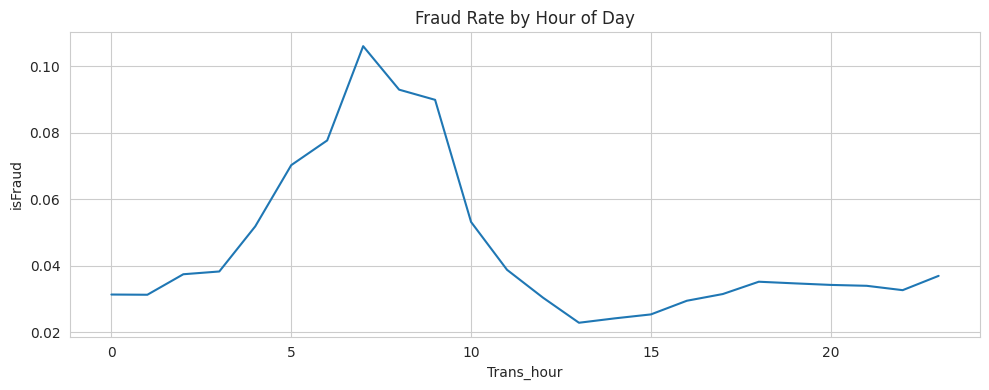

/tmp/ipykernel_35/3830906910.py:14: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Trans_days', y='isFraud', data=train, ci=None)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


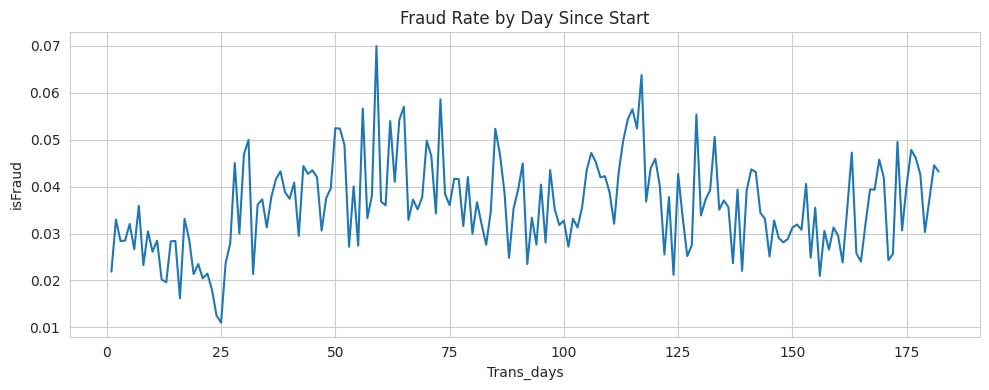

In [92]:

# ## Time Features

# %%
train['Trans_days'] = np.floor(train['TransactionDT'] / 86400)
train['Trans_hour'] = np.floor((train['TransactionDT'] % 86400) / 3600)

plt.figure(figsize=(10,4))
sns.lineplot(x='Trans_hour', y='isFraud', data=train, ci=None)
plt.title('Fraud Rate by Hour of Day')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,4))
sns.lineplot(x='Trans_days', y='isFraud', data=train, ci=None)
plt.title('Fraud Rate by Day Since Start')
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


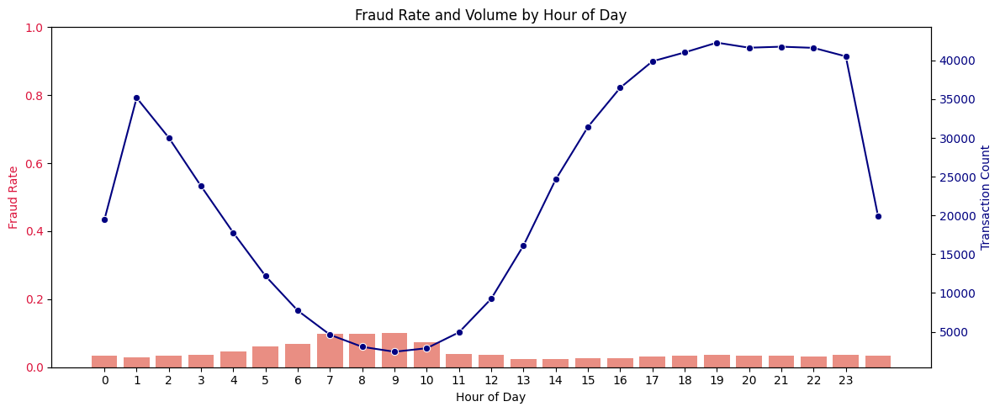

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

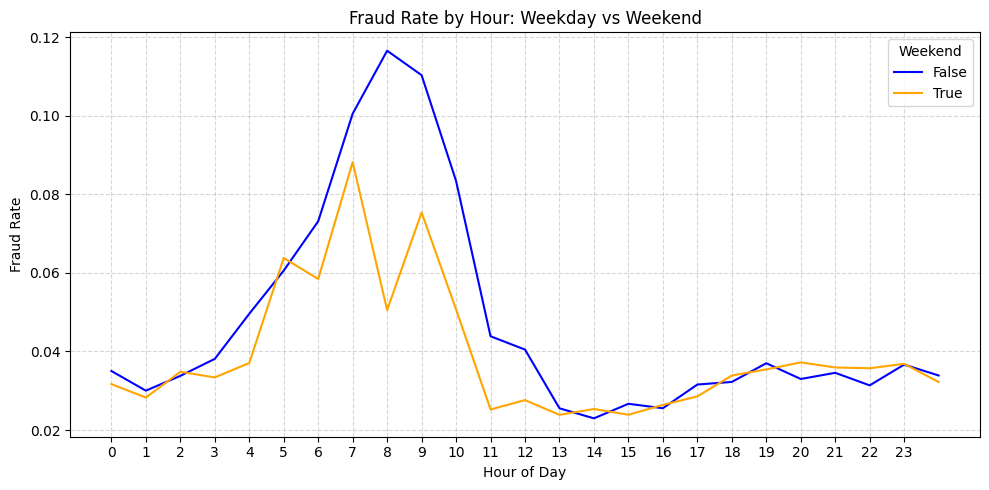


--- Overall Time Period Summary ---
Total Transactions: 590,540
Total Frauds: 20,663
Overall Fraud Rate: 0.0350 (3.50%)


In [61]:
# Clean barplot of Fraud Rate by Hour + overlay transaction count + weekday/weekend

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Round hours
train['TransactionHourRounded'] = train['TransactionHour'].round().astype(int)

# Optional: flag weekend (assuming TransactionDay has already been extracted)
if 'TransactionDay' not in train.columns:
    train['TransactionDay'] = (train['TransactionDT'] / (3600 * 24)).astype(int) % 7
train['IsWeekend'] = train['TransactionDay'].isin([5, 6])

# Fraud rate and transaction count per hour
hour_stats = train.groupby('TransactionHourRounded').agg(
    FraudRate=('isFraud', 'mean'),
    TxnCount=('TransactionID', 'count')
).reset_index()

# Plot barplot of fraud rate with line overlay for volume
fig, ax1 = plt.subplots(figsize=(12, 5))
sns.barplot(x='TransactionHourRounded', y='FraudRate', data=hour_stats, color='salmon', ax=ax1)
ax1.set_ylabel('Fraud Rate', color='crimson')
ax1.set_xlabel('Hour of Day')
ax1.set_ylim(0, 1)
ax1.set_title('Fraud Rate and Volume by Hour of Day')
ax1.tick_params(axis='y', labelcolor='crimson')

# Secondary axis for transaction count
ax2 = ax1.twinx()
sns.lineplot(x='TransactionHourRounded', y='TxnCount', data=hour_stats, ax=ax2, color='navy', marker='o')
ax2.set_ylabel('Transaction Count', color='navy')
ax2.tick_params(axis='y', labelcolor='navy')

plt.xticks(range(0, 24))
plt.tight_layout()
plt.show()

# Weekday vs Weekend fraud rate by hour
hour_weekend_stats = train.groupby(['TransactionHourRounded', 'IsWeekend']).agg(
    FraudRate=('isFraud', 'mean')
).reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=hour_weekend_stats, x='TransactionHourRounded', y='FraudRate', hue='IsWeekend', palette={True: 'orange', False: 'blue'})
plt.title("Fraud Rate by Hour: Weekday vs Weekend")
plt.xlabel("Hour of Day")
plt.ylabel("Fraud Rate")
plt.xticks(range(0, 24))
plt.legend(title='Weekend')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Overall fraud rate and transaction stats
overall_fraud_rate = train['isFraud'].mean()
total_transactions = len(train)
total_frauds = train['isFraud'].sum()
print("\n--- Overall Time Period Summary ---")
print(f"Total Transactions: {total_transactions:,}")
print(f"Total Frauds: {total_frauds:,}")
print(f"Overall Fraud Rate: {overall_fraud_rate:.4f} ({overall_fraud_rate * 100:.2f}%)")


In [98]:
hourly_fraud = train.groupby('Trans_hour')['isFraud'].agg(['mean', 'count']).rename(columns={'mean': 'FraudRate', 'count': 'Transactions'})
daily_fraud = train.groupby('Trans_days')['isFraud'].agg(['mean', 'count']).rename(columns={'mean': 'FraudRate', 'count': 'Transactions'})
print("Fraud Rate by Hour of Day:")
print(hourly_fraud.round(4))

print("\nFraud Rate by Day:")
print(daily_fraud.round(4))

Fraud Rate by Hour of Day:
            FraudRate  Transactions
Trans_hour                         
0.0            0.0314         37795
1.0            0.0313         32797
2.0            0.0375         26732
3.0            0.0383         20802
4.0            0.0519         14839
5.0            0.0703          9701
6.0            0.0777          6007
7.0            0.1061          3704
8.0            0.0930          2591
9.0            0.0900          2479
10.0           0.0532          3627
11.0           0.0388          6827
12.0           0.0304         12451
13.0           0.0229         20315
14.0           0.0242         28328
15.0           0.0254         33859
16.0           0.0295         38698
17.0           0.0315         40723
18.0           0.0352         41639
19.0           0.0347         42115
20.0           0.0343         41782
21.0           0.0340         41641
22.0           0.0327         41139
23.0           0.0370         39949

Fraud Rate by Day:
            Fraud


--- Overall Time Period Summary ---
Total Transactions: 590,540
Total Frauds: 20,663
Overall Fraud Rate: 0.0350 (3.50%)


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


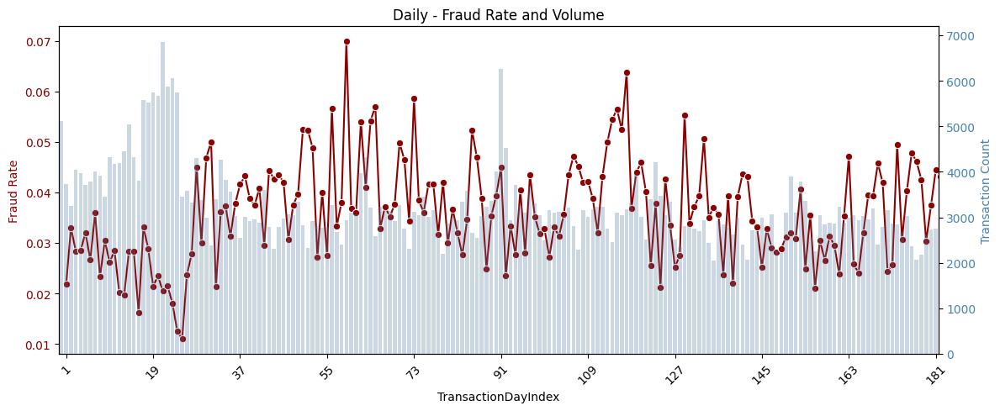

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


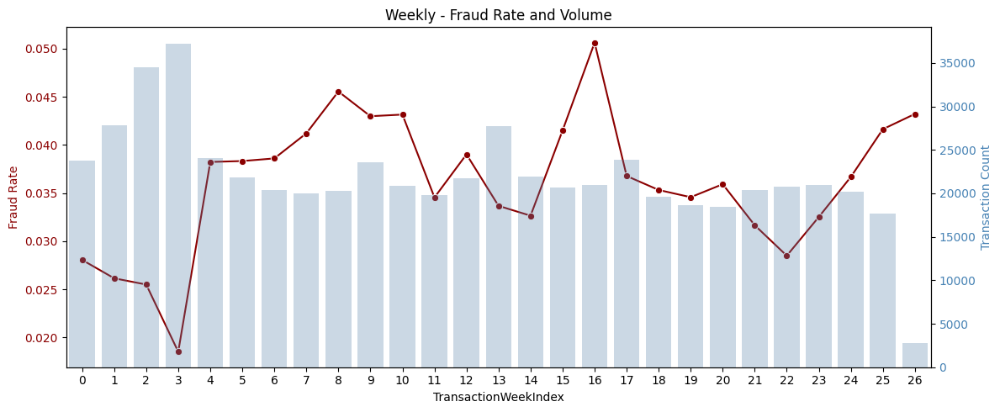

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


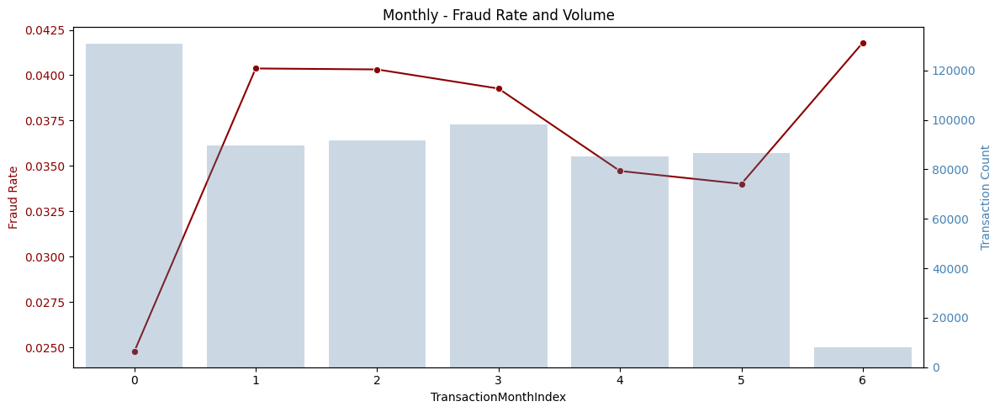

In [66]:

# Overall fraud rate and transaction stats
overall_fraud_rate = train['isFraud'].mean()
total_transactions = len(train)
total_frauds = train['isFraud'].sum()
print("\n--- Overall Time Period Summary ---")
print(f"Total Transactions: {total_transactions:,}")
print(f"Total Frauds: {total_frauds:,}")
print(f"Overall Fraud Rate: {overall_fraud_rate:.4f} ({overall_fraud_rate * 100:.2f}%)")

# Create time index in days
train['TransactionDayIndex'] = (train['TransactionDT'] / (3600 * 24)).astype(int)
train['TransactionWeekIndex'] = train['TransactionDayIndex'] // 7
train['TransactionMonthIndex'] = train['TransactionDayIndex'] // 30

# Function to plot fraud rate and volume by temporal bin with cleaner daily x-axis
def plot_temporal_fraud_stats(group_col, title):
    stats = train.groupby(group_col).agg(
        FraudRate=('isFraud', 'mean'),
        TxnCount=('TransactionID', 'count')
    ).reset_index()

    fig, ax1 = plt.subplots(figsize=(12, 5))
    sns.lineplot(data=stats, x=group_col, y='FraudRate', ax=ax1, color='darkred', marker='o')
    ax1.set_ylabel('Fraud Rate', color='darkred')
    ax1.set_xlabel(group_col)
    ax1.set_title(f'{title} - Fraud Rate and Volume')
    ax1.tick_params(axis='y', labelcolor='darkred')

    ax2 = ax1.twinx()
    sns.barplot(data=stats, x=group_col, y='TxnCount', ax=ax2, color='steelblue', alpha=0.3)
    ax2.set_ylabel('Transaction Count', color='steelblue')
    ax2.tick_params(axis='y', labelcolor='steelblue')

    if title == 'Daily':
        step = max(1, len(stats) // 10)
        ax1.set_xticks(stats[group_col][::step])
        ax1.set_xticklabels(stats[group_col][::step], rotation=45)

    plt.tight_layout()
    plt.show()

# Plot by Day, Week, Month, Year
plot_temporal_fraud_stats('TransactionDayIndex', 'Daily')
plot_temporal_fraud_stats('TransactionWeekIndex', 'Weekly')
plot_temporal_fraud_stats('TransactionMonthIndex', 'Monthly')



In [72]:
df = train

# 10.1 Continuous–Continuous: Correlation Heatmap
# ------------------------------------------------

# Select a subset of numeric features (e.g. log‐amt, time, count‐encodings, and top C-features)
num_feats = [
    'TransactionAmt_log',
    'Trans_hour',
    'card1_count',
    'card2_count',
    'addr1_count',
    'addr2_count'
] + [f'C{i}' for i in range(1, 6)]

# Compute correlation matrix
corr_mat = df[num_feats].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_mat,
    annot=True,
    fmt=".2f",
    cmap='vlag',
    center=0,
    square=True,
    cbar_kws={'shrink': .8}
)
plt.title('Correlation Heatmap of Selected Numeric Features')
plt.tight_layout()
plt.show()


# %% 
# 10.2 Continuous–Categorical: Pivot‐Table Heatmap of Fraud Rate
# --------------------------------------------------------------

# Example: how fraud rate varies across Transaction Hour vs. Product Code
pivot_hour_prod = df.pivot_table(
    index='Trans_hour',
    columns='ProductCD',
    values='isFraud',
    aggfunc='mean'
)

plt.figure(figsize=(12, 6))
sns.heatmap(
    pivot_hour_prod,
    annot=True,
    fmt=".2%",              # show as percentage
    cmap='YlOrRd',
    cbar_kws={'label': 'Fraud Rate'}
)
plt.ylabel('Hour of Day')
plt.xlabel('ProductCD')
plt.title('Fraud Rate by Hour of Day and ProductCD')
plt.tight_layout()
plt.show()


# %% 
# 10.3 Categorical–Categorical: Fraud Rate across Browser × Device
# -----------------------------------------------------------------

# First, pick two categorical features—browser_group and DeviceType (if available)
# If DeviceType is not present, swap in another high-cardinality cat.
if 'DeviceType' in df.columns:
    idx, cols = 'browser_group', 'DeviceType'
else:
    idx, cols = 'browser_group', 'ProductCD'

pivot_cat = df.pivot_table(
    index=idx,
    columns=cols,
    values='isFraud',
    aggfunc='mean'
)

plt.figure(figsize=(12, 6))
sns.heatmap(
    pivot_cat,
    annot=True,
    fmt=".2%",
    cmap='PuBuGn',
    cbar_kws={'label': 'Fraud Rate'}
)
plt.ylabel(idx)
plt.xlabel(cols)
plt.title(f'Fraud Rate by {idx} and {cols}')
plt.tight_layout()
plt.show()


KeyError: "['Trans_hour', 'card1_count', 'card2_count', 'addr1_count', 'addr2_count'] not in index"

# 8. Top Correlated Features with isFraud

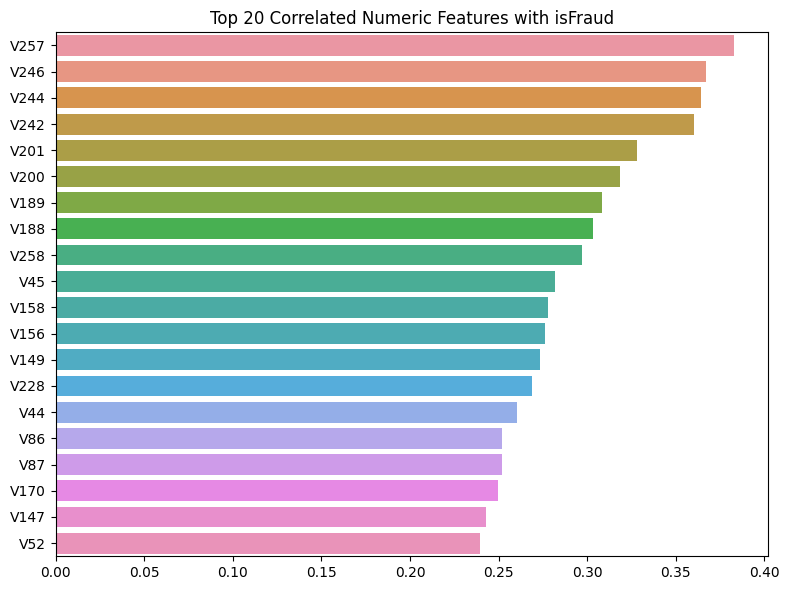

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

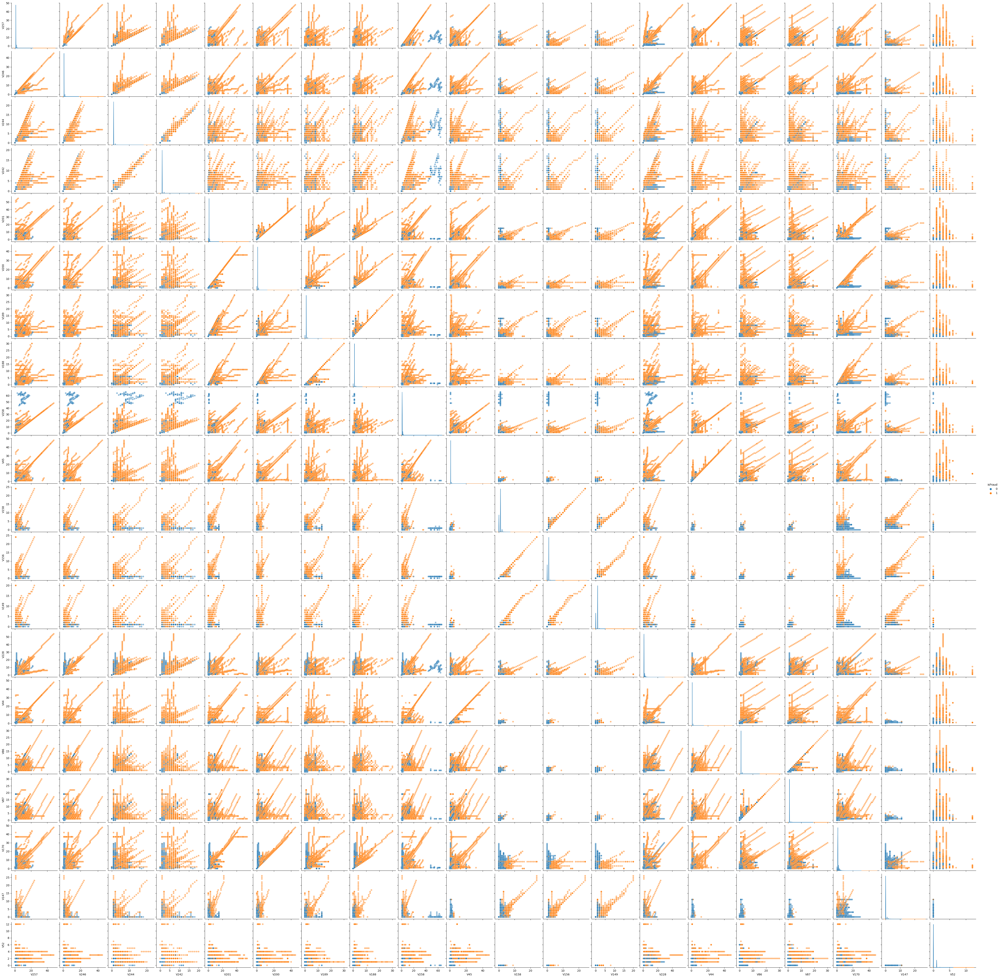

In [28]:
# Select only numeric columns
numeric_cols = train.select_dtypes(include=[np.number])

# Compute correlation matrix
corr = numeric_cols.corr()

# Check and plot top correlations with 'isFraud'
if 'isFraud' in corr.columns:
    top_corr = corr['isFraud'].drop('isFraud').abs().sort_values(ascending=False).head(20)

    plt.figure(figsize=(8, 6))
    sns.barplot(x=top_corr.values, y=top_corr.index)
    plt.title("Top 20 Correlated Numeric Features with isFraud")
    plt.tight_layout()
    plt.show()

    pairplot on numeric subset
    selected_cols = top_corr.index.tolist() + ['isFraud']
    sns.pairplot(train[selected_cols], hue='isFraud', plot_kws={'alpha': 0.5})
    plt.show()
else:
    print("'isFraud' not in correlation matrix. Check numeric columns.")


In [15]:
# Identify categorical columns
cat_cols = train.select_dtypes(include=['object']).columns.tolist()

In [16]:
# Apply frequency encoding to all categorical columns
for col in cat_cols:
    freq_map = train[col].value_counts().to_dict()
    train[f'{col}_FE'] = train[col].map(freq_map)


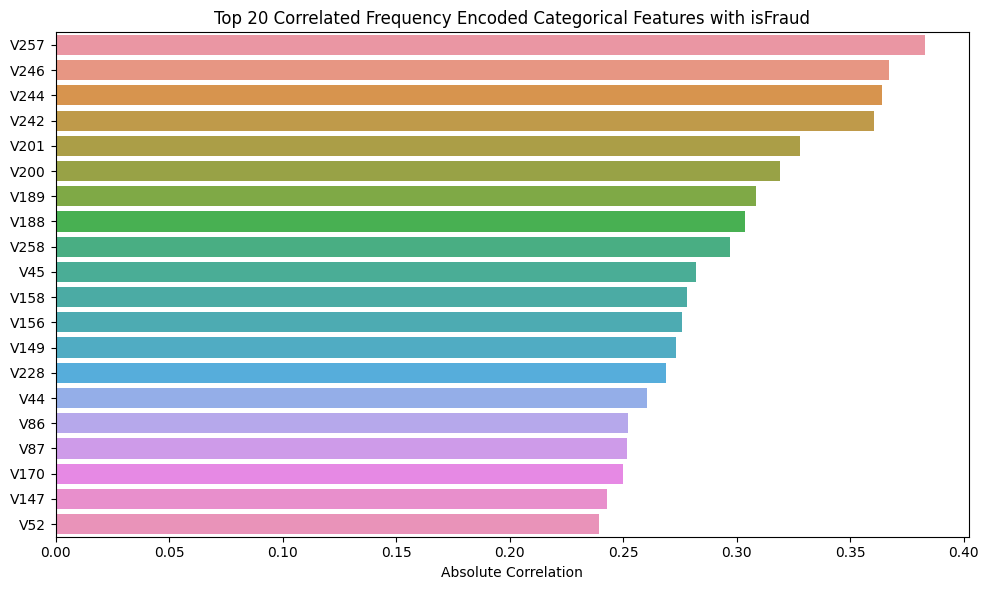

Top Frequency-Encoded Categorical Correlations with isFraud:
V257    0.383060
V246    0.366878
V244    0.364129
V242    0.360590
V201    0.328005
V200    0.318783
V189    0.308219
V188    0.303582
V258    0.297151
V45     0.281832
V158    0.278066
V156    0.275952
V149    0.273282
V228    0.268861
V44     0.260376
V86     0.251828
V87     0.251737
V170    0.249794
V147    0.242894
V52     0.239469
Name: isFraud, dtype: float64


In [28]:
# Select numeric features including encoded ones
numeric_cols = train.select_dtypes(include=[np.number])
corr_matrix = numeric_cols.corr()

# Compute correlation of encoded features with isFraud
if 'isFraud' in corr_matrix:
    top_cat_corr = corr_matrix['isFraud'].drop('isFraud').abs().sort_values(ascending=False).head(20)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_cat_corr.values, y=top_cat_corr.index)
    plt.title("Top 20 Correlated Frequency Encoded Categorical Features with isFraud")
    plt.xlabel("Absolute Correlation")
    plt.tight_layout()
    plt.show()

    print("Top Frequency-Encoded Categorical Correlations with isFraud:")
    print(top_cat_corr)
else:
    print("'isFraud' not found in correlation matrix.")

In [20]:
# Calculate correlation only for encoded categorical features

import pandas as pd
import numpy as np

# Identify frequency encoded features
encoded_cols = [col for col in train.columns if col.endswith('_FE')]
encoded_df = train[encoded_cols + ['isFraud']].copy()

# Compute correlation matrix for encoded features
corr_matrix = encoded_df.corr()

# Extract correlations with isFraud
if 'isFraud' in corr_matrix:
    encoded_corr = corr_matrix['isFraud'].drop('isFraud').abs().sort_values(ascending=False)
    print("Correlation of Frequency Encoded Features with isFraud:")
    print(encoded_corr.head(20))
else:
    print("'isFraud' not found in correlation matrix.")


Correlation of Frequency Encoded Features with isFraud:
ProductCD_FE        0.130294
R_emaildomain_FE    0.114579
card6_FE            0.100482
M4_FE               0.076735
M3_FE               0.038697
M2_FE               0.037091
M9_FE               0.032055
M5_FE               0.031802
P_emaildomain_FE    0.031085
M6_FE               0.023282
M8_FE               0.019067
M7_FE               0.006831
card4_FE            0.005477
M1_FE               0.001259
Name: isFraud, dtype: float64


Correlation of Frequency Encoded Features with isFraud:
ProductCD_FE        0.130294
R_emaildomain_FE    0.114579
card6_FE            0.100482
M4_FE               0.076735
M3_FE               0.038697
M2_FE               0.037091
M9_FE               0.032055
M5_FE               0.031802
P_emaildomain_FE    0.031085
M6_FE               0.023282
M8_FE               0.019067
M7_FE               0.006831
card4_FE            0.005477
M1_FE               0.001259
Name: isFraud, dtype: float64


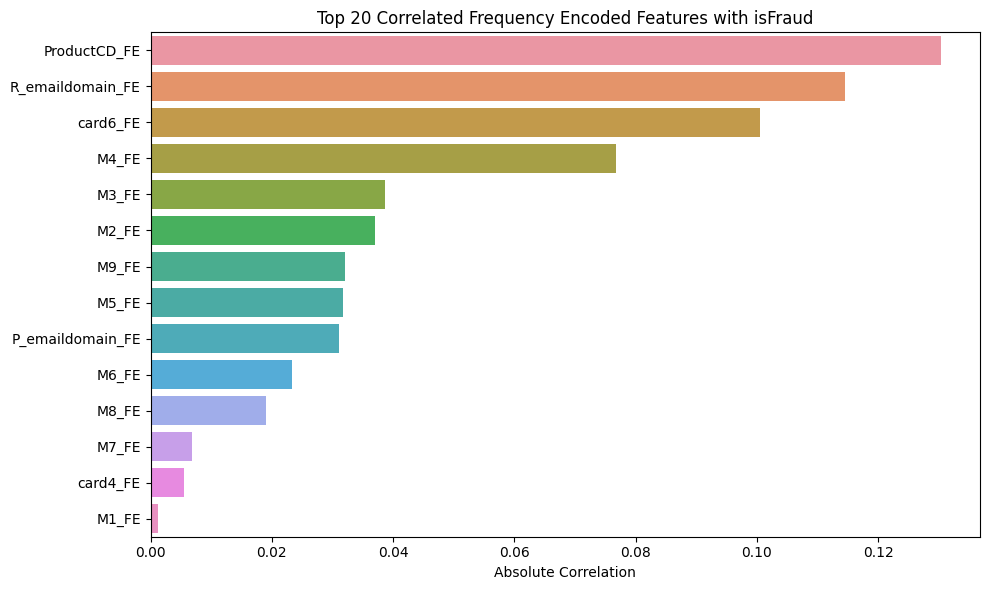

In [25]:
    top_encoded_corr = encoded_corr.head(20)

    print("Correlation of Frequency Encoded Features with isFraud:")
    print(top_encoded_corr)

    # Plot barplot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_encoded_corr.values, y=top_encoded_corr.index)
    plt.title("Top 20 Correlated Frequency Encoded Features with isFraud")
    plt.xlabel("Absolute Correlation")
    plt.tight_layout()
    plt.show()

Correlation of Target Encoded Features with isFraud:
ProductCD_TE        0.168376
R_emaildomain_TE    0.163510
M4_TE               0.144460
card6_TE            0.100570
P_emaildomain_TE    0.083969
M3_TE               0.038697
M2_TE               0.037091
M9_TE               0.032055
M5_TE               0.031802
card4_TE            0.024890
M6_TE               0.023282
M8_TE               0.019067
M7_TE               0.006831
M1_TE               0.001259
Name: isFraud, dtype: float64


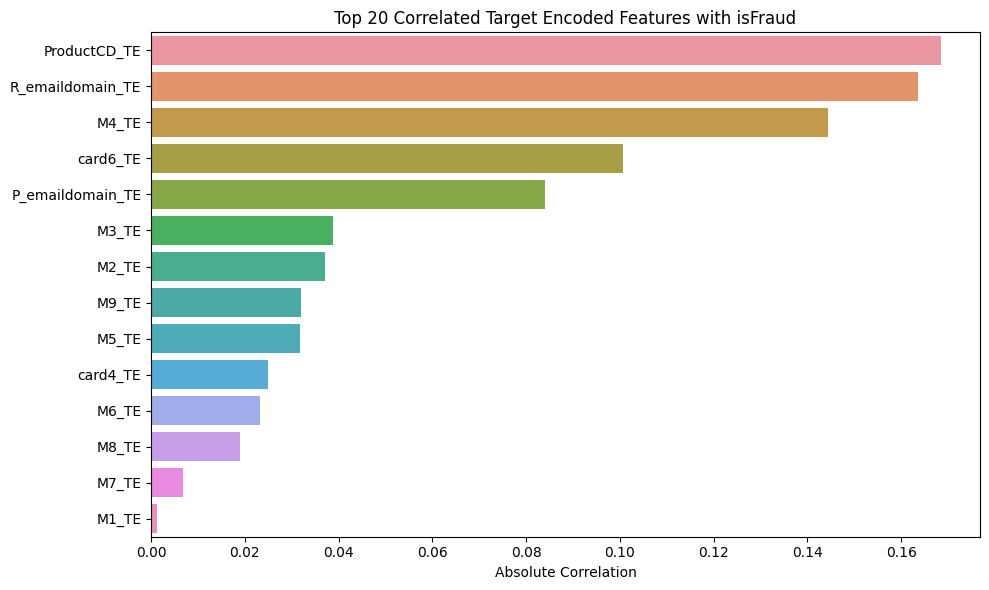

In [30]:
# Calculate correlation only for target encoded categorical features and plot top correlations

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Create target-encoded features if missing
cat_cols = train.select_dtypes(include=['object']).columns.tolist()

for col in cat_cols:
    if f'{col}_TE' not in train.columns:
        try:
            target_mean = train.groupby(col)['isFraud'].mean()
            train[f'{col}_TE'] = train[col].map(target_mean)
        except Exception as e:
            print(f"Skipping {col} due to error: {e}")

# Identify target encoded features
target_encoded_cols = [col for col in train.columns if col.endswith('_TE')]

# Check if any target-encoded columns exist
if target_encoded_cols:
    target_encoded_df = train[target_encoded_cols + ['isFraud']].copy()

    # Drop columns with all NaNs or constant values
    target_encoded_df = target_encoded_df.dropna(axis=1, how='all')
    target_encoded_df = target_encoded_df.loc[:, target_encoded_df.nunique() > 1]

    # Compute correlation matrix for target encoded features
    corr_matrix = target_encoded_df.corr()

    if 'isFraud' in corr_matrix:
        target_corr = corr_matrix['isFraud'].drop('isFraud').abs().sort_values(ascending=False)
        top_target_corr = target_corr.head(20)

        if not top_target_corr.empty:
            print("Correlation of Target Encoded Features with isFraud:")
            print(top_target_corr)

            # Plot barplot
            plt.figure(figsize=(10, 6))
            sns.barplot(x=top_target_corr.values, y=top_target_corr.index)
            plt.title("Top 20 Correlated Target Encoded Features with isFraud")
            plt.xlabel("Absolute Correlation")
            plt.tight_layout()
            plt.show()
        else:
            print("No valid target-encoded features were found for correlation.")
    else:
        print("'isFraud' not found in correlation matrix.")
else:
    print("No target encoded features found in dataset.")


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


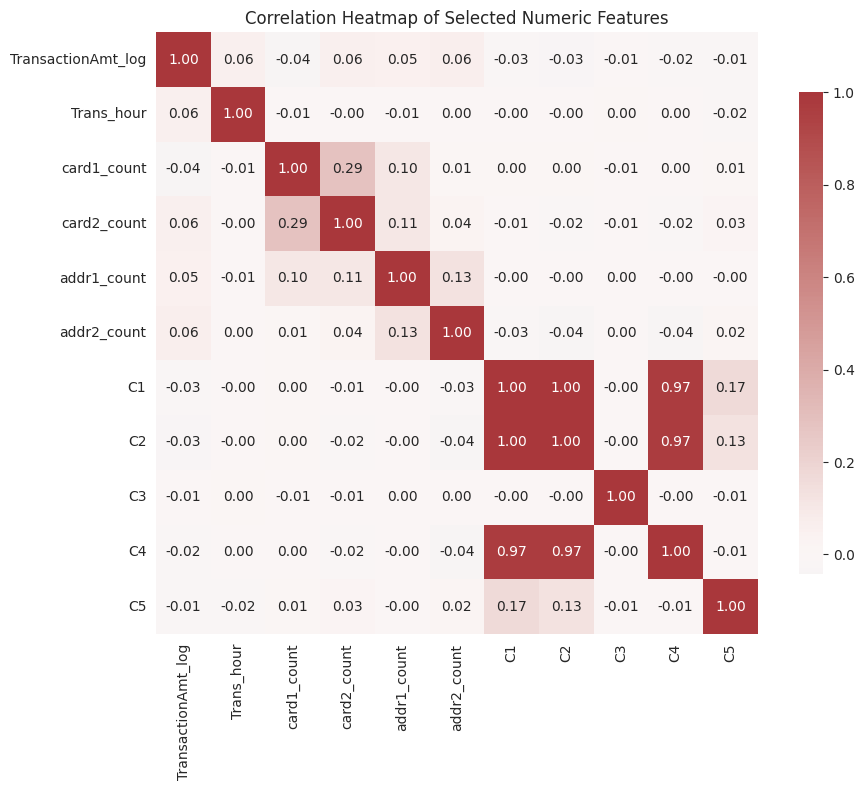

In [93]:
# %% [markdown]
# ## 10. Feature Interaction Heatmaps

# %% 
import matplotlib.pyplot as plt
import seaborn as sns

# 10.1 Continuous–Continuous: Correlation Heatmap
# ------------------------------------------------

# Select a subset of numeric features (e.g. log‐amt, time, count‐encodings, and top C-features)
num_feats = [
    'TransactionAmt_log',
    'Trans_hour',
    'card1_count',
    'card2_count',
    'addr1_count',
    'addr2_count'
] + [f'C{i}' for i in range(1, 6)]

# Compute correlation matrix
corr_mat = df[num_feats].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_mat,
    annot=True,
    fmt=".2f",
    cmap='vlag',
    center=0,
    square=True,
    cbar_kws={'shrink': .8}
)
plt.title('Correlation Heatmap of Selected Numeric Features')
plt.tight_layout()
plt.show()




/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


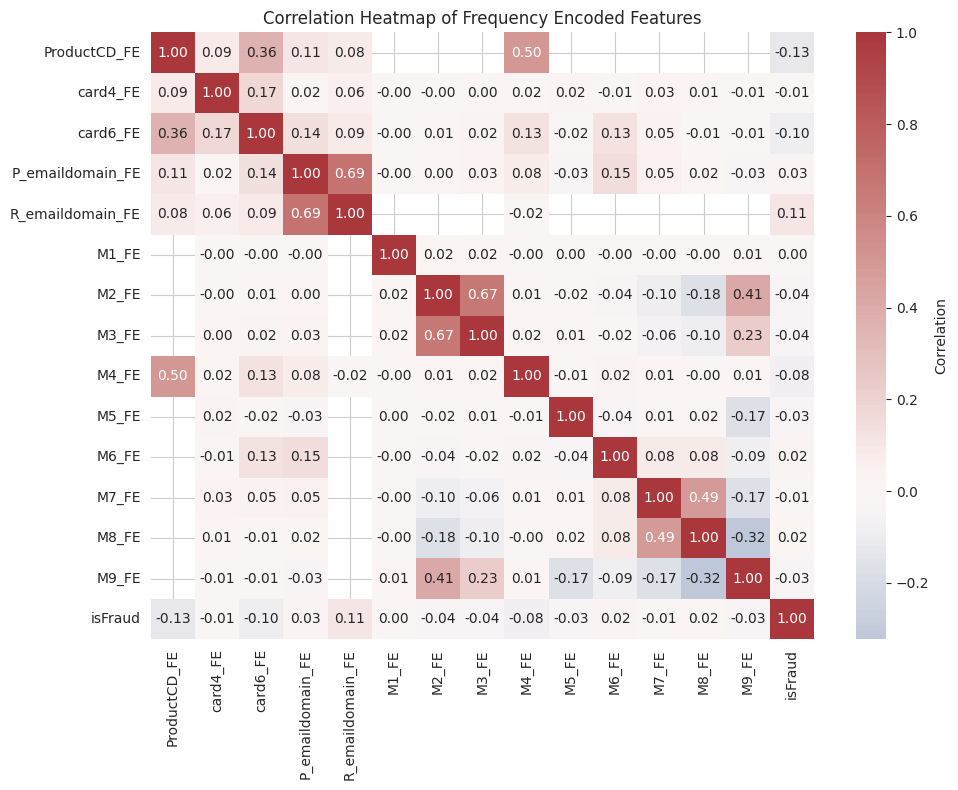


Correlation Matrix of Frequency Encoded Features:
                  ProductCD_FE  card4_FE  card6_FE  P_emaildomain_FE  \
ProductCD_FE             1.000     0.086     0.364             0.111   
card4_FE                 0.086     1.000     0.174             0.019   
card6_FE                 0.364     0.174     1.000             0.139   
P_emaildomain_FE         0.111     0.019     0.139             1.000   
R_emaildomain_FE         0.081     0.064     0.091             0.689   
M1_FE                      NaN    -0.000    -0.001            -0.003   
M2_FE                      NaN    -0.003     0.013             0.003   
M3_FE                      NaN     0.004     0.024             0.035   
M4_FE                    0.502     0.020     0.129             0.078   
M5_FE                      NaN     0.024    -0.021            -0.034   
M6_FE                      NaN    -0.011     0.128             0.149   
M7_FE                      NaN     0.035     0.046             0.052   
M8_FE        

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


In [103]:
fe_cols = [col for col in train.columns if col.endswith('_FE')]
te_cols = [col for col in train.columns if col.endswith('_TE')]

# Frequency Encoded Correlation
if fe_cols:
    corr_fe = train[fe_cols + ['isFraud']].corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_fe, annot=True, fmt=".2f", cmap='vlag', center=0, cbar_kws={'label': 'Correlation'})
    plt.title('Correlation Heatmap of Frequency Encoded Features')
    plt.tight_layout()
    plt.show()
    print("\nCorrelation Matrix of Frequency Encoded Features:")
    print(corr_fe.round(3))



/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


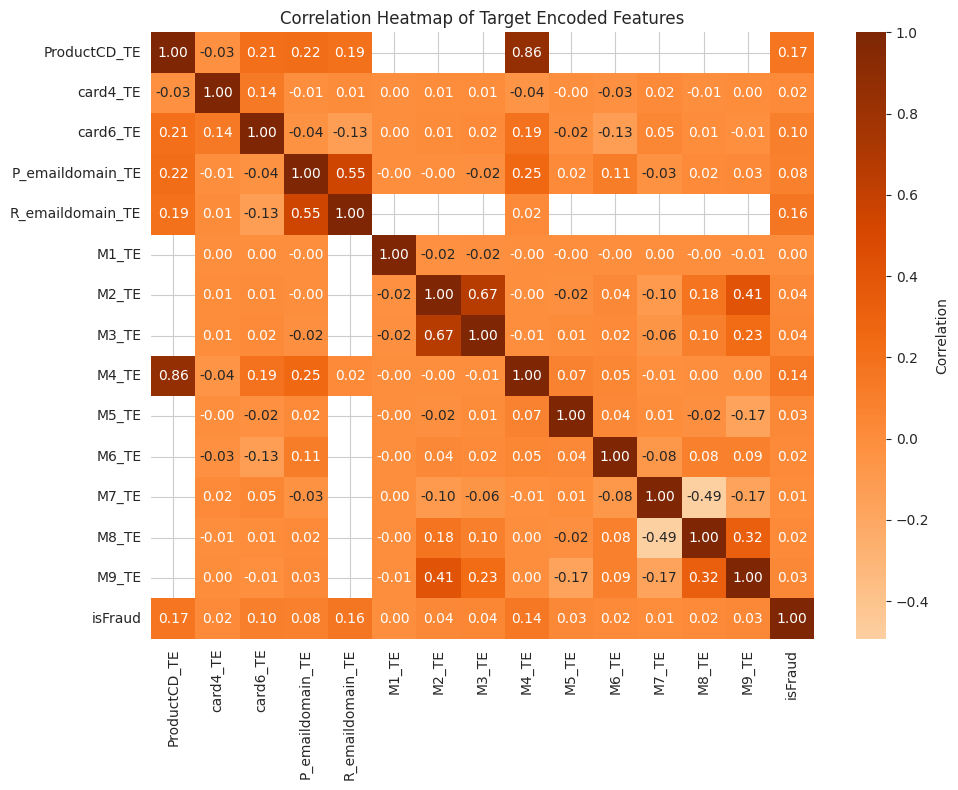


Correlation Matrix of Target Encoded Features:
                  ProductCD_TE  card4_TE  card6_TE  P_emaildomain_TE  \
ProductCD_TE             1.000    -0.026     0.212             0.223   
card4_TE                -0.026     1.000     0.135            -0.006   
card6_TE                 0.212     0.135     1.000            -0.035   
P_emaildomain_TE         0.223    -0.006    -0.035             1.000   
R_emaildomain_TE         0.195     0.012    -0.129             0.548   
M1_TE                      NaN     0.001     0.001            -0.004   
M2_TE                      NaN     0.007     0.013            -0.001   
M3_TE                      NaN     0.007     0.023            -0.018   
M4_TE                    0.856    -0.045     0.188             0.248   
M5_TE                      NaN    -0.000    -0.021             0.017   
M6_TE                      NaN    -0.032    -0.127             0.108   
M7_TE                      NaN     0.023     0.046            -0.034   
M8_TE           

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


In [104]:
# Target Encoded Correlation
if te_cols:
    corr_te = train[te_cols + ['isFraud']].corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_te, annot=True, fmt=".2f", cmap='Oranges', center=0, cbar_kws={'label': 'Correlation'})
    plt.title('Correlation Heatmap of Target Encoded Features')
    plt.tight_layout()
    plt.show()
    print("\nCorrelation Matrix of Target Encoded Features:")
    print(corr_te.round(3))

In [29]:
correlation_data = {
    'Feature': [
        'V257', 'V246', 'V244', 'V242', 'V201', 'V200', 'V189', 'V188', 'V258', 'V45',
        'V158', 'V156', 'V149', 'V228', 'V44', 'V86', 'V87', 'V170', 'V147', 'V52'
    ],
    'Correlation with isFraud': [
        0.383060, 0.366878, 0.364129, 0.360590, 0.328005, 0.318783, 0.308219, 0.303582,
        0.297151, 0.281832, 0.278066, 0.275952, 0.273282, 0.268861, 0.260376, 0.251828,
        0.251737, 0.249794, 0.242894, 0.239469
    ]
}

# Create and display the DataFrame
correlation_df = pd.DataFrame(correlation_data)
display(correlation_df)

,Feature,Correlation with isFraud
0,V257,0.383060
1,V246,0.366878
2,V244,0.364129
3,V242,0.360590
4,V201,0.328005
5,V200,0.318783
6,V189,0.308219
7,V188,0.303582
8,V258,0.297151
9,V45,0.281832


In [30]:
missing_pct = train.isnull().mean() * 100
top5_missing = missing_pct.sort_values(ascending=False).head(5)

# Extract only those columns and their missing percentage
top5_missing_df = top5_missing.reset_index()
top5_missing_df.columns = ['Feature', 'Missing Percentage']

from IPython.display import display
display(top5_missing_df)

,Feature,Missing Percentage
0,dist2,93.628374
1,D7,93.409930
2,D13,89.509263
3,D14,89.469469
4,D12,89.041047


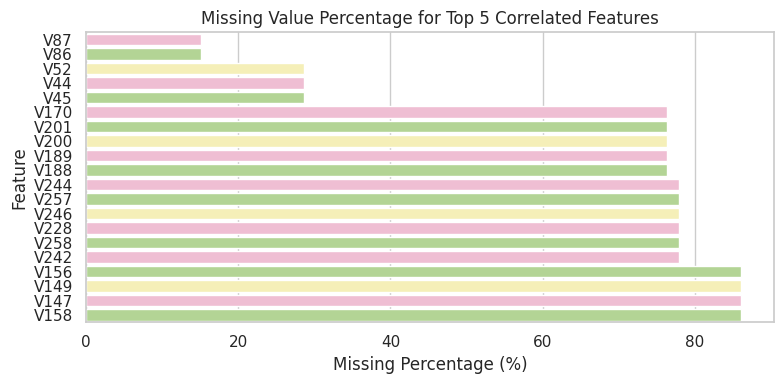

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sort by Missing Percentage descending
top5_corr_missing_df = top5_corr_missing_df.sort_values(by='Missing Percentage', ascending=True)  # Ascending for horizontal barplot

# Custom pastel-style palette
custom_palette = sns.color_palette(['#f7b6d2', '#b2df8a', '#fff7ae', '#f7b6d2', '#b2df8a'])  # pastel pink, green, yellow repeated

# Set seaborn style
sns.set(style="whitegrid")

# Plot
plt.figure(figsize=(8, 4))
sns.barplot(
    data=top5_corr_missing_df,
    y='Feature',
    x='Missing Percentage',
    palette=custom_palette
)

plt.title('Missing Value Percentage for Top 20 Correlated Features')
plt.xlabel('Missing Percentage (%)')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


# **Feature Engineering**

**Reducing the Features**

In [1]:
train_trx_fp = '/kaggle/input/ieee-fraud-detection/train_transaction.csv'
test_trx_fp  = '/kaggle/input/ieee-fraud-detection/test_transaction.csv'
train_id_fp  = '/kaggle/input/ieee-fraud-detection/train_identity.csv'
test_id_fp   = '/kaggle/input/ieee-fraud-detection/test_identity.csv'  

import pandas as pd

train_trx  = pd.read_csv(train_trx_fp)
test_trx   = pd.read_csv(test_trx_fp)
train_id   = pd.read_csv(train_id_fp)
test_id    = pd.read_csv(test_id_fp)

train = train_trx.merge(train_id, how="left", on="TransactionID")
test  = test_trx.merge(test_id,  how="left", on="TransactionID")

print(f"train shape: {train.shape},   test shape: {test.shape}")


train shape: (590540, 434),   test shape: (506691, 433)


In [2]:
# ----------------------------------------
# 1 Basic cleaning  (NaN pruning)
# ----------------------------------------
def drop_high_nan(df, thresh=0.99):
    """Drop columns whose missing-rate exceeds `thresh`."""
    na_frac = df.isna().mean()
    cols_to_drop = na_frac[na_frac > thresh].index
    return df.drop(columns=cols_to_drop), cols_to_drop.tolist()

train, dropped = drop_high_nan(train, 0.99)
test  = test.drop(columns=dropped, errors="ignore")
print(f"Dropped {len(dropped)} ≥99 %-NaN columns")

Dropped 9 ≥99 %-NaN columns


In [3]:
# ----------------------------------------
# 2 V-column reduction (group-by-NaN-count  ➜  intra-group corr)
#    Precisely the heuristic described in the Medium post
# ----------------------------------------
def compress_high_corr(df, cols, corr_thr=0.75):
    """
    For a given list of columns:
      1. Split them into NaN-count groups
      2. Inside each group cluster highly-correlated sets (≥ corr_thr)
      3. From every cluster keep the column with the most unique values
    Returns: list of 'survivor' columns
    """
    survivors = []
    # 1) group by identical NaN pattern
    groups = {}
    for c in cols:
        key = df[c].isna().sum()
        groups.setdefault(key, []).append(c)

    # 2 + 3) per-group reduction
    for gcols in groups.values():
        if len(gcols) == 1:
            survivors.append(gcols[0]); continue
        sub = df[gcols].corr().abs()
        # simple greedy clustering
        visited = set()
        for c in gcols:
            if c in visited: continue
            cluster = [c] + [x for x in gcols if x != c and sub.loc[c, x] >= corr_thr]
            visited.update(cluster)
            # keep column with max-unique
            keep = max(cluster, key=lambda x: df[x].nunique(dropna=False))
            survivors.append(keep)
    return survivors

v_cols   = [c for c in train.columns if c.startswith("V")]
v_keep   = compress_high_corr(train, v_cols, corr_thr=0.75)
v_dropped = set(v_cols) - set(v_keep)

train = train.drop(columns=v_dropped)
test  = test.drop( columns=v_dropped)
print(f"Reduced V-cols from {len(v_cols)} ➜ {len(v_keep)}")

Reduced V-cols from 339 ➜ 141


In [16]:

# ----------------------------------------
# 3 Simple, low-risk feature creations
# ----------------------------------------
import numpy as np

def enrich_common(df):
    # —–– Transaction time buckets
    df["TransactionDT_dt"] = pd.to_datetime(df["TransactionDT"], unit="s", origin="2017-12-01")
    df["Trans_weekday"]     = df["TransactionDT_dt"].dt.weekday
    df["Trans_hour"]        = df["TransactionDT_dt"].dt.hour

    # —–– Log-scaled amount + cents
    df["LogTransAmt"] = np.log1p(df["TransactionAmt"])
    df["Trans_cents"] = ((df["TransactionAmt"] -  np.floor(df["TransactionAmt"])) * 100).astype(int)

    # —–– Parent e-mail provider
    for side in ["P_emaildomain", "R_emaildomain"]:
        new = f"{side}_company"
        df[new] = df[side].str.split(".").str[0].fillna("unknown")

    # —–– Very lightweight device family extraction
    df["DeviceCorp"] = df["DeviceInfo"].str.extract(r"^([A-Za-z]+)").fillna("other")
    return df

train = enrich_common(train)
test  = enrich_common(test)

In [12]:
# 4 UID-based aggregation features
#    (card1 + D1 + addr1 was the best UID in the article)
# ----------------------------------------
def add_uid_aggs(tr, te, uid_cols=("card1", "D1", "addr1"),
                 aggs=["mean", "std", "count"],
                 base_cols=("TransactionAmt",)):
    tr["uid"] = tr[list(uid_cols)].astype(str).agg("_".join, axis=1)
    te["uid"] = te[list(uid_cols)].astype(str).agg("_".join, axis=1)

    for base in base_cols:
        tmp = tr.groupby("uid")[base].agg(aggs)
        tmp.columns = [f"{base}_uid_{a}" for a in aggs]
        # map into both splits
        tr = tr.join(tmp, on="uid")
        te = te.join(tmp, on="uid")
    return tr, te

train, test = add_uid_aggs(train, test,
                           uid_cols=("card1", "D1", "addr1"),
                           aggs=["mean", "std"],
                           base_cols=("TransactionAmt",))


In [13]:
cat_cols = train.select_dtypes(include=['object']).columns.tolist()

# Apply frequency encoding to all categorical columns
for col in cat_cols:
    freq_map = train[col].value_counts().to_dict()
    train[f'{col}_FE'] = train[col].map(freq_map)


In [18]:
# Display nicely
from IPython.display import display


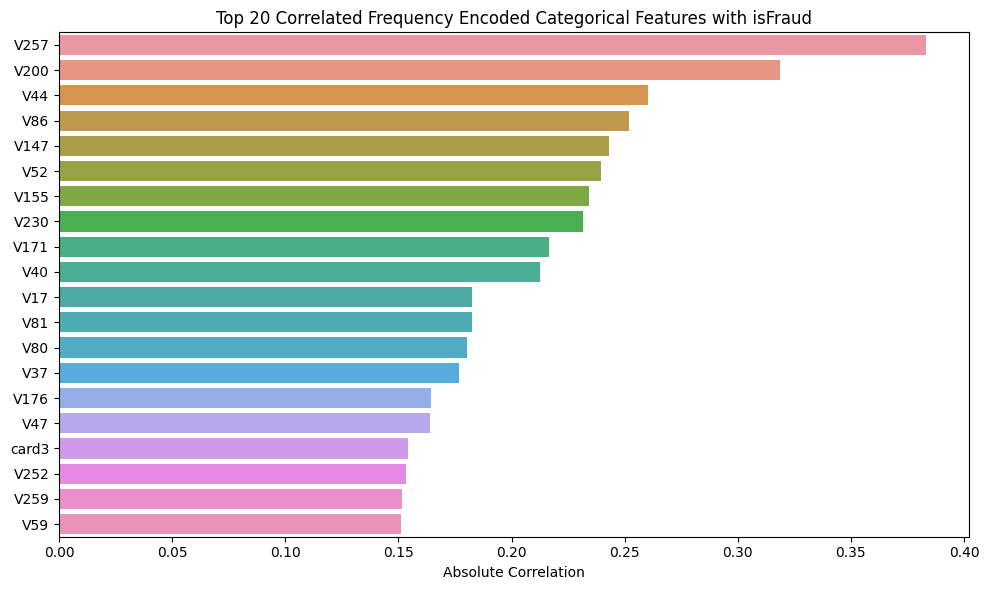

Top Frequency-Encoded Categorical Correlations with isFraud:
V257     0.383060
V200     0.318783
V44      0.260376
V86      0.251828
V147     0.242894
V52      0.239469
V155     0.234199
V230     0.231740
V171     0.216508
V40      0.212442
V17      0.182673
V81      0.182377
V80      0.180299
V37      0.176947
V176     0.164343
V47      0.164114
card3    0.154151
V252     0.153364
V259     0.151638
V59      0.151062
Name: isFraud, dtype: float64


In [14]:

import matplotlib.pyplot as plt
import seaborn as sns

# Select numeric features including encoded ones
numeric_cols = train.select_dtypes(include=[np.number])
corr_matrix = numeric_cols.corr()

# Compute correlation of encoded features with isFraud
if 'isFraud' in corr_matrix:
    top_cat_corr = corr_matrix['isFraud'].drop('isFraud').abs().sort_values(ascending=False).head(20)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_cat_corr.values, y=top_cat_corr.index)
    plt.title("Top 20 Correlated Frequency Encoded Categorical Features with isFraud")
    plt.xlabel("Absolute Correlation")
    plt.tight_layout()
    plt.show()

    print("Top Frequency-Encoded Categorical Correlations with isFraud:")
else:
    print("'isFraud' not found in correlation matrix.")

In [27]:
display(corr_matrix[["isFraud"]]).head(5)

,isFraud
TransactionID,0.014166
isFraud,1.000000
TransactionDT,0.013103
TransactionAmt,0.011320
card1,-0.013640
...,...
R_emaildomain_company_FE,-0.135302
DeviceCorp_FE,-0.102955
TransactionAmt_uid_mean,0.003914
TransactionAmt_uid_std,-0.038455


AttributeError: 'NoneType' object has no attribute 'head'

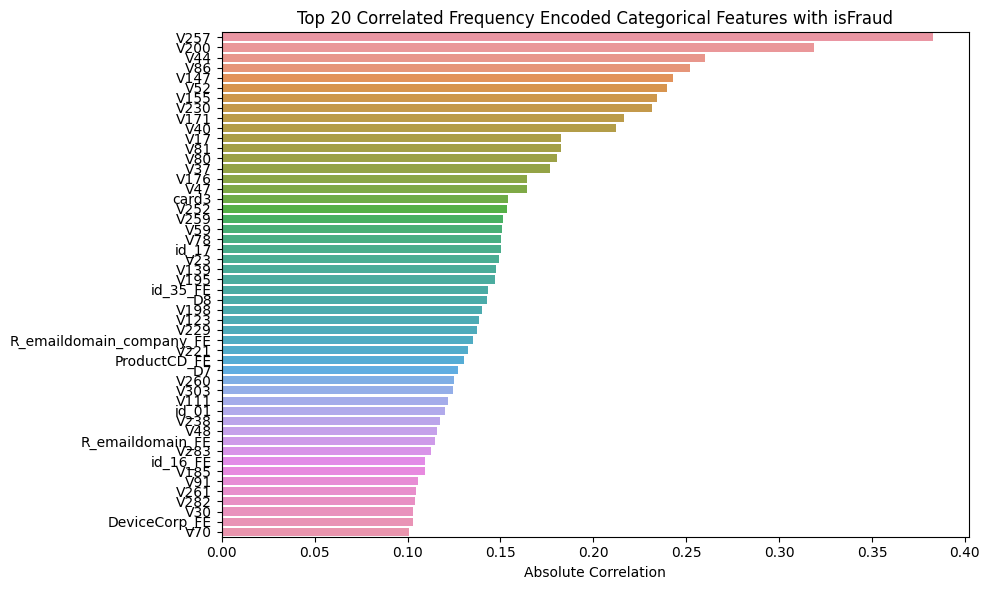

Top Frequency-Encoded Categorical Correlations with isFraud:
V257                        0.383060
V200                        0.318783
V44                         0.260376
V86                         0.251828
V147                        0.242894
V52                         0.239469
V155                        0.234199
V230                        0.231740
V171                        0.216508
V40                         0.212442
V17                         0.182673
V81                         0.182377
V80                         0.180299
V37                         0.176947
V176                        0.164343
V47                         0.164114
card3                       0.154151
V252                        0.153364
V259                        0.151638
V59                         0.151062
V78                         0.150425
id_17                       0.150100
V23                         0.149408
V139                        0.147594
V195                        0.147052
id_35_FE      

In [15]:
if 'isFraud' in corr_matrix:
    top_cat_corr = corr_matrix['isFraud'].drop('isFraud').abs().sort_values(ascending=False).head(50)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_cat_corr.values, y=top_cat_corr.index)
    plt.title("Top 20 Correlated Frequency Encoded Categorical Features with isFraud")
    plt.xlabel("Absolute Correlation")
    plt.tight_layout()
    plt.show()

    print("Top Frequency-Encoded Categorical Correlations with isFraud:")
    print(top_cat_corr)
else:
    print("'isFraud' not found in correlation matrix.")

In [14]:
train["DeviceCorp"]

0           other
1           other
2           other
3           other
4         SAMSUNG
           ...   
590535      other
590536      other
590537      other
590538      other
590539      other
Name: DeviceCorp, Length: 590540, dtype: object

******Drop >= 99% missing columns**

In [29]:
import pandas as pd
import numpy as np

# Identify frequency encoded features
encoded_cols = [col for col in train.columns if col.endswith('_FE')]
encoded_df = train[encoded_cols + ['isFraud']].copy()

# Compute correlation matrix for encoded features
corr_matrix = encoded_df.corr()

# Extract correlations with isFraud
if 'isFraud' in corr_matrix:
    encoded_corr = corr_matrix['isFraud'].drop('isFraud').abs().sort_values(ascending=False)
    print("Correlation of Frequency Encoded Features with isFraud:")
    print(encoded_corr.head(20))
else:
    print("'isFraud' not found in correlation matrix.")


Correlation of Frequency Encoded Features with isFraud:
id_35_FE                    0.143162
R_emaildomain_company_FE    0.135302
ProductCD_FE                0.130294
R_emaildomain_FE            0.114579
id_16_FE                    0.109633
DeviceCorp_FE               0.102955
card6_FE                    0.100482
id_29_FE                    0.097955
id_28_FE                    0.092937
M4_FE                       0.076735
id_38_FE                    0.070577
DeviceType_FE               0.065825
id_30_FE                    0.056698
DeviceInfo_FE               0.050305
id_34_FE                    0.048388
id_31_FE                    0.042886
M3_FE                       0.038697
id_36_FE                    0.037208
M2_FE                       0.037091
id_33_FE                    0.034216
Name: isFraud, dtype: float64


Correlation of Frequency Encoded Features with isFraud:
id_35_FE                    0.143162
R_emaildomain_company_FE    0.135302
ProductCD_FE                0.130294
R_emaildomain_FE            0.114579
id_16_FE                    0.109633
DeviceCorp_FE               0.102955
card6_FE                    0.100482
id_29_FE                    0.097955
id_28_FE                    0.092937
M4_FE                       0.076735
id_38_FE                    0.070577
DeviceType_FE               0.065825
id_30_FE                    0.056698
DeviceInfo_FE               0.050305
id_34_FE                    0.048388
id_31_FE                    0.042886
M3_FE                       0.038697
id_36_FE                    0.037208
M2_FE                       0.037091
id_33_FE                    0.034216
Name: isFraud, dtype: float64


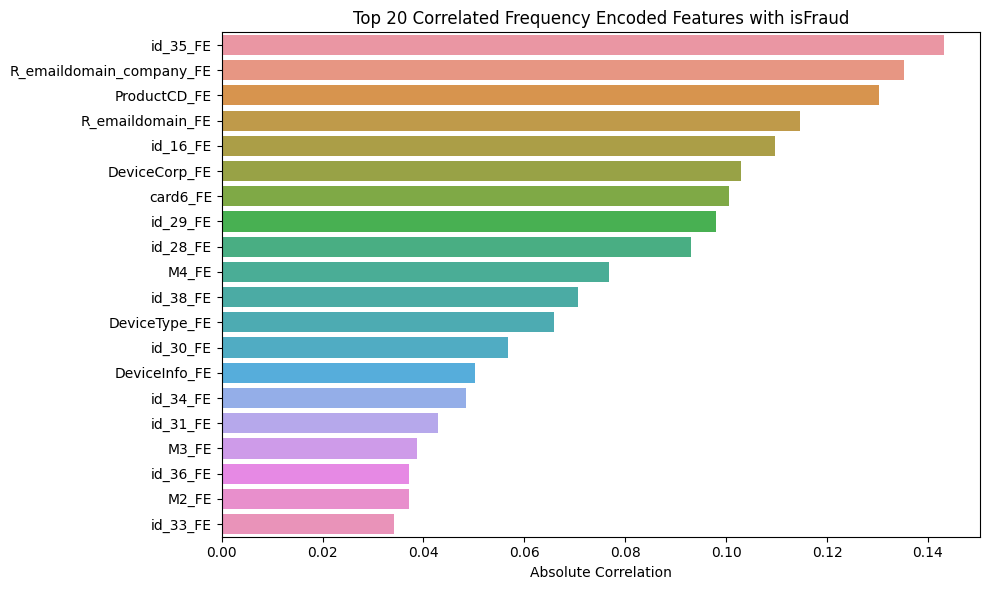

In [30]:
    top_encoded_corr = encoded_corr.head(20)

    print("Correlation of Frequency Encoded Features with isFraud:")
    print(top_encoded_corr)

    # Plot barplot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_encoded_corr.values, y=top_encoded_corr.index)
    plt.title("Top 20 Correlated Frequency Encoded Features with isFraud")
    plt.xlabel("Absolute Correlation")
    plt.tight_layout()
    plt.show()
